In [1]:
from tqdm import tqdm
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from sklearn.neighbors import KernelDensity  # kernel density estimation
from mpmath import jtheta  # jacobi elliptic theta function

Importing and processing the USG and ground-based comparison data `csv`, which we use to compute our KDE for speed and radiant uncertainty:

In [2]:
# skip the first two rows after header and the last three rows since those are garbage
# note that we want the usg-ground-based-comparison file to be in this form since we are removing absolute rows
usg_ground_based_comparison = pd.read_csv('usg-ground-based-comparison/usg-ground-based-comparison_EDITED.csv', 
                                          sep = ',', skip_blank_lines=True).iloc[2:-3]  

# forward fill Event and radiant, backward fill dv based on the xlsx file
usg_ground_based_comparison['Event'] = usg_ground_based_comparison['Event'].fillna(method='ffill')
usg_ground_based_comparison['Radiant Diff'] = usg_ground_based_comparison['Radiant Diff'].fillna(method='ffill')
usg_ground_based_comparison['DV'] = usg_ground_based_comparison['DV'].fillna(method='bfill')

# drop every other row since we don't need duplicate rows for event, radiant diff, or dv
# however we want to keep the usg reported speed, zenith angle and other parameters (second row for each event), 
# so we start by dropping the first row rather than the second
usg_ground_based_comparison = usg_ground_based_comparison.iloc[1::2]
# strip whitespace from headers to avoid errors with indexing later
usg_ground_based_comparison.columns = usg_ground_based_comparison.columns.str.strip()
# sort dataframe alphabetically inplace
usg_ground_based_comparison.sort_values('Event', inplace=True)

/tmp/ipykernel_213509/615123784.py:7: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  usg_ground_based_comparison['Event'] = usg_ground_based_comparison['Event'].fillna(method='ffill')
/tmp/ipykernel_213509/615123784.py:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  usg_ground_based_comparison['Radiant Diff'] = usg_ground_based_comparison['Radiant Diff'].fillna(method='ffill')
/tmp/ipykernel_213509/615123784.py:9: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  usg_ground_based_comparison['DV'] = usg_ground_based_comparison['DV'].fillna(method='bfill')


Get the speed and radiant uncertainties:

In [3]:
# convert Speed, DV, Radiant Diff, Radiant Zenith Angle, Height, Begin Height, End Height, Length to numeric to avoid errors
cols_to_convert = ['Speed', 'DV', 'Radiant Diff', 'Radiant Zenith Angle', 'Height', 'Begin Height (km)', 'End Height (km)', 'Length (km)']
usg_ground_based_comparison[cols_to_convert] = usg_ground_based_comparison[cols_to_convert].apply(pd.to_numeric, errors='coerce', axis=1)

# convert date to datetime object
usg_ground_based_comparison['Date'] = pd.to_datetime(usg_ground_based_comparison['Date'])

# usg speed, dv, drad
usg_speed = usg_ground_based_comparison['Speed']
# speed and radiant uncertainties
dv = usg_ground_based_comparison['DV']
drad = usg_ground_based_comparison['Radiant Diff']

Construct the KDEs for speed and log-radiant uncertainty:

Speed uncertainty:

In [4]:
# parameters for fitting the KDE
dv_ub = 8.  # upper bound for fitting kde
dv_lb = -8.  # lower bound for fitting kde
dv_bandwidth = 0.7  # this is finicky  # 0.8 used by default
kernel_type = 'gaussian'  # use gaussian kernel

# setting up the values
values_dv = np.linspace(dv_lb, dv_ub, int(1e4))
kde_dv = np.array(dv).reshape((len(dv), 1))
kde_values_dv = values_dv.reshape(len(values_dv), 1)

# doing the KDE fit
kde_model_dv = KernelDensity(bandwidth=dv_bandwidth, kernel=kernel_type)
kde_model_dv.fit(kde_dv)

# plotting the KDE
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (12, 8), dpi=800)
plt.hist(dv, density=True, bins='auto', color='k', alpha=0.9, align='mid')
plt.plot(kde_values_dv, np.exp(kde_model_dv.score_samples(kde_values_dv)), color='r')  # np.exp because sklearn returns score samples as log
plt.xlabel('Speed difference (km/s)', fontsize=20, weight='bold'), plt.ylabel('Density', fontsize=20, weight='bold')
ax.tick_params(axis='both', which='major', labelsize=18)
ax.tick_params(axis='both', which='minor', labelsize=14)
# tick lengths
plt.minorticks_on()
ax.tick_params('x', length=12, width=2., which='major')
ax.tick_params('x', length=6, width=1., which='minor')
# turn off minor ticks for left
ax.tick_params('y', length=10., which='major')
ax.tick_params('y', which='minor', left=False)
# set ticks
ax.xaxis.set_minor_locator(ticker.MultipleLocator(1.))
# ax.yaxis.set_minor_locator(ticker.MultipleLocator(5.))
# tight alyout
plt.tight_layout()
# save
plt.savefig('dda_talk_plots/speed_difference_histogram.png')

Log-radiant uncertainty:

In [5]:
# parameters for the KDE fitting
drad_lb = 0.  # upper bound for fitting kde
drad_ub = 2.  # lower bound for fitting kde
log_drad_bandwidth = 0.15  # this is finicky  # 0.15 used by default

# setting up the values
log_drad = np.log10(drad)  # convert to log
values_drad = np.linspace(drad_lb, drad_ub, int(1e4))
kde_log_drad = np.array(log_drad).reshape((len(log_drad), 1))
kde_values_log_drad = values_drad.reshape(len(values_drad), 1)

# kde fit
kde_model_log_drad = KernelDensity(bandwidth=log_drad_bandwidth, kernel=kernel_type)  # use the same kernel as for the dv kde
kde_model_log_drad.fit(kde_log_drad)

# plot
fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (12, 8), dpi=800)
plt.hist(log_drad, density=True, bins='auto', color='k', alpha=0.9, align='mid')
plt.plot(kde_values_log_drad, np.exp(kde_model_log_drad.score_samples(kde_values_log_drad)), color='r')  # np.exp because sklearn returns score samples as log
# label
plt.xlabel(r'Log-radiant difference (log$\mathbf{_{10}}\degree$)', fontsize=20, weight='bold'), plt.ylabel('Density', fontsize=20, weight='bold')
ax.tick_params(axis='both', which='major', labelsize=18)
ax.tick_params(axis='both', which='minor', labelsize=14)
# tick lengths
plt.minorticks_on()
ax.tick_params('x', length=12, width=2., which='major')
ax.tick_params('x', length=6, width=1., which='minor')
# turn off minor ticks for left
ax.tick_params('y', length=10., which='major')
ax.tick_params('y', which='minor', left=False)
# set ticks
ax.xaxis.set_minor_locator(ticker.MultipleLocator(0.25))
# ax.yaxis.set_minor_locator(ticker.MultipleLocator(5.))
# tight alyout
plt.tight_layout()
# save
plt.savefig('dda_talk_plots/log_radiant_difference_histogram.png')

Reading in the `.csv` file containing the decameter impactors:

In [6]:
# we define decameter impactors to be between 7.5 and 25 meters in diameter
# range of sizes (diameter in meters) we consider to be in the decameter regime
decameter_lb = 7.5  # lower bound
decameter_ub = 25.  # upper bound

# read file containing all impactors, no need to define columns since pandas reads this fine
all_impactors = pd.read_csv('../JPL-website-Oct19-2022-ORBITS-radiants-wspeeds-decameter-impactors-GOOD (1)_EDITED.csv', header='infer')
# filtering to only include those of decameter size (diameter is within some size range)
decameter_impactors = all_impactors.loc[(decameter_lb < all_impactors['Diameter (rho = 1500 kgm-3)']) & 
                                        (all_impactors['Diameter (rho = 1500 kgm-3)'] < decameter_ub)]

Now we want to convert the state vectors for the $100$ Monte Carlo samples of each decameter impact event. We first take $100$ Monte Carlo samples using the KDEs defined earlier. The state vectors we use are:
- Velocity
- Time of observation
- Latitude
- Longitude
- Elevation
- Azimuth
- Altitude
  
with random velocity errors added that we draw from our KDE for the velocity uncertainty earlier. The state vectors are then converted 
into orbital elements $\left(a, e, i, \Omega, \omega, M\right)$ (semi-major axis, eccentricity, inclination, longitude of ascending node, argument of pericenter, mean anomaly)  using `WMPL`.


KDE for the radiant uncertainty is drawn over $\log_{10}$-radiant uncertainty

First get the state vectors for all the events:

In [7]:
# state vectors
state_vector_list = ['Speed', 'Time', 'Latitude Numerical', 'Longitude Numerical', 'Altitude(km)', 'Zenith Distance', 'Radiant azimuth']
# drops the events that don't have the required information, and reset the index
impactor_state_vectors = decameter_impactors[state_vector_list].dropna().reset_index(drop=True)
# convert time to datetime format
impactor_state_vectors['Time'] = pd.to_datetime(impactor_state_vectors['Time'], format='mixed', dayfirst=True)
# convert every column other than time to numeric
impactor_state_vectors[impactor_state_vectors.columns[impactor_state_vectors.columns != 'Time']] = impactor_state_vectors[impactor_state_vectors.columns[impactor_state_vectors.columns != 'Time']].apply(pd.to_numeric, errors='coerce', axis=1)
# convert time to the format that wmpl takes in, '%Y%m%d-%H%M%S.%f'
impactor_state_vectors['Time'] = impactor_state_vectors['Time'].dt.strftime('%Y%m%d-%H%M%S.%f')

Then for each event, get $1000$ Monte Carlo samples, compute the orbital parameters for each Monte Carlo samples, and save it to an array:

Defining the `get_orbital_parameters` function to be used for computing orbital parameters from the state vector parameters -- this should be run in the `wmpl` conda environment or any environment with the `wmpl.Trajectory.Orbit` module active:

**NOTE**: sometimes wmpl.Trajectory.Orbit doesn't return the orbital elements? For example the command: 

`python3 -m wmpl.Trajectory.Orbit -v 9.542999528129108 -t '20130430-084000.000000' -a 35.5 -o -30.7 -e 21.2 --azim 297.7709815 --alt 39.50375116 --vrotcorr --statfixed` 

doesn't return orbital elements

In [8]:
import subprocess

# list of orbital parameters we want to get (named the same as in the wmpl output, in that order
orb_param_variables = ['a', 'e', 'i', 'peri', 'node', 'M']  
# number of Monte Carlo samples for each event
n_monte_carlo_samples = 1000

### HELPER FUNCTION to get the zenith/azimuth from the radiant uncertainty
def get_zen_azim_diff(zen, azim, theta, n_samples):
    """
    Get n_samples random new radiants that are a fixed angle theta away from the radiant given by (zen, azim) in 3D
    Note that zenith angle is 90 degrees - azimuth angle

    param zen: zenith angle, in degrees
    param azim: azimuth angle, in degrees
    param theta: angle from radiant that we want our new radiants to be, in degrees
    param n_samples: number of new radiants we want

    return zen_diff, azim_diff: tuple of arrays of floats of size n_samples each: 
    zen_diff and azim_diff are the new randomly generated radiant zenith/azimuth minus the given radiant zenith/azimuth
    """
    new_zens_deg = np.array([np.nan])  # initialize this to get the while loop started

    # this is a while loop to reject any zenith distance above 90 or below 0:
    while not np.all((new_zens_deg > 0.) & (new_zens_deg < 90.)):
        phis = np.random.uniform(0., 2 * np.pi, size=n_samples)  # these are the random directions we want our radiants to be in

        # convert zenith and azimuth into cartesian coordinates x, y, z
        v1 = np.array([np.sin(np.deg2rad(zen)) * np.cos(np.deg2rad(azim)), 
                       np.sin(np.deg2rad(zen)) * np.sin(np.deg2rad(azim)), 
                       np.cos(np.deg2rad(zen))])
        # get random new normalized vectors that are an angle theta away from v1, following the procedure described here:
        # https://math.stackexchange.com/questions/2057315/parameterising-all-vectors-a-fixed-angle-from-another-vector-in-3d
        # standard basis vector to use for generating orthonormal basis
        standard_basis_vec = np.array([1, 0, 0]) 
        # generate two basis vectors orthonormal to v1
        # normalize v1 in case it isn't already
        v1_normed = v1/np.linalg.norm(v1)
        # generate v2
        v2 = np.cross(v1_normed, standard_basis_vec)
        # normalize it
        v2_normed = v2/np.linalg.norm(v2)
        # generate a normalized v3 from the normalized v1 and v2
        v3_normed = np.cross(v1_normed, v2_normed)
        # now generate new vectors with radiant difference scattered by phis using vectorized operations
        new_radiants = v1_normed + np.tan(np.deg2rad(theta)) * (np.multiply.outer(np.cos(phis), v2_normed) + 
                                                                np.multiply.outer(np.sin(phis), v3_normed))
        # normalize the new vectors
        new_radiants_normed = new_radiants/np.linalg.norm(new_radiants, axis=1).reshape(-1, 1)
        # convert from cartesian coordinates back to zenith/azimuth coordinates
        xs, ys, zs = new_radiants_normed.T
        # get zeniths from cartesian
        new_zens = np.arccos(zs)
        # get azimuths from cartesian
        new_azims = np.arcsin(ys/np.sin(new_zens))
        # convert to degrees
        new_zens_deg = np.rad2deg(new_zens)
        new_azims_deg = np.rad2deg(new_azims)
        # first, manually convert the azimuths to the right quadrant since they can range from [0, 2pi] while zeniths can only be [0, pi/2]
        # Q1
        if 0. <= azim <= 90.:
            new_azims_deg = new_azims_deg  # already correct
        # Q2 and Q3:
        if 90. < azim <= 270.:
            new_azims_deg = np.abs(new_azims_deg - 180.)  # convert 
        # Q4:
        if 270. < azim <= 360.:
            new_azims_deg += 360  # convert
        
        # # finally, convert any negative azimuths back to [0, 360] degrees by adding 360 to any values less than 0
        # new_azims_deg += 360 * (new_azims_deg < 0)
        # # and convert any azimuths above 360 back down to [0, 360] as well
        # new_azims_deg = np.mod(new_azims_deg, 360)
            
    # return zenith and azimuth difference
    return new_zens_deg - zen, new_azims_deg - azim


# draw a monte carlo sample and get the orbital parameters using WMPL
def get_monte_carlo_orbital_parameters(kdes_state_vector_params, orb_param_variables=orb_param_variables, r_sun=0.00465):
    """
    Samples a Monte Carlo sample from provided KDEs for speed and radiant difference, and gets 
    the orbital parameter values corresponding to each parameter in orb_param_variables from the state vector state_vector
    
    param kdes_state_vector_params: tuple of (dv_kde, drad_kde, v, t, a, o, e, azim, alt):
    dv_kde is the speed uncertainty kde: should be a scikit-learn KernelDensity object
    log_drad_kde is the log10-radiant uncertainty kde: should be a scikit-learn KernelDensity object
    v is the velocity in km/s
    t is the time of the event in the form that the wmpl.Trajectory.Orbit function takes in, '%Y%m%d-%H%M%S.%f'
    a is the latitude, in degrees N
    o is the longitude, in degrees E
    e is the elevation of the event, in km
    azim is the radiant azimuth, in degrees
    zen is the zenith distance (90 minus the altitude angle), in degrees

    returns a 1-D array of parameter values corresponding to the parameters in orb_param_variables, in the same order
    """
    orb_param_array = np.array([])  # initialize orb_param_array as empty array so it doesn't have a size to start
    ecc = np.nan  # initialize both of these as nans so they don't have a size to start
    sma = np.nan

    # unpack kdes and state_vector_params
    dv_kde, log_drad_kde, v, t, a, o, e, azim, zen = kdes_state_vector_params  # get the kdes and state vector parameters
    # converting from zenith angle to altitude angle
    alt = 90 - zen
    
    #### THIS IS A WHILE LOOP AS A SAFEGUARD BECAUSE IT SEEMS LIKE SOMETIMES WMPL DOESN'T RETURN THE ORBITAL ELEMENTS AT ALL

    # if orbital parameter array is empty (no orbital elements returned), OR eccentricity is greater than 0.9, OR q is inside the radius of the sun, 
    # then we repeat this until none of those 3 are true
    while (not orb_param_array.size or ecc > 0.98 or sma * (1. - ecc) < r_sun):
        np.random.seed(None)  # explicitly reset the seed since the sampler for sklearn doesn't seem to be sampling randomly otherwise
        # get monte carlo sample of the speed and log-radiant uncertainty
        dv = dv_kde.sample(n_samples=1).flatten()  # get a single dv mc sample
        log_drad = log_drad_kde.sample(n_samples=1).flatten()  # get a single log drad mc sample

        # convert the log-radiant uncertainty into zenith and azimuth uncertainty using the helper function
        # with the restrictions that zenith must be between [0, 90] degrees
        dzen, dazim = get_zen_azim_diff(zen, azim, 10 ** log_drad, n_samples=1)  # log10-radiant so convert back to radiant
        # difference in altitude is negative of difference in zenith since it's 90 - zenith
        # so zen1 - zen2 = (90 - alt1) - (90 - alt2) = alt2 - alt1
        dalt = -dzen
        # adding the uncertainty in velocity to the velocity vector of the event
        # and adding the uncertainty in zenith angle and azimuth angle to the radiant
        # convert the singleton arrays to floats as well
        new_v = v + dv[0]
        new_alt = alt + dalt[0]
        # azimuth is modulo 360 to keep it between 0 and 360 degrees
        new_azim = (azim + dazim[0]) % 360
        # get the output from the wmpl.Trajectory.Orbit script
        output = subprocess.run(['python3', '-m', 'wmpl.Trajectory.Orbit', '-v', f'{new_v}', '-t', f'{t}', '-a', f'{a}', 
                                 '-o', f'{o}', '-e', f'{e}', '--azim', f'{new_azim}', '--alt', f'{new_alt}', 
                                 '--vrotcorr', '--statfixed'], capture_output=True)
        # get the orbital parameters from the output in the order of orb_param_variables
        
        # orb_param_list = [elem for elem in list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) 
        #               if elem.startswith(tuple(orb_param_variables))]
        # orb_param_array = [np.float64(string) for param in orb_param_list 
        #                    for string in param.split() if string.lstrip('-').replace('.', '').isdigit() or string =='nan']]
        
        orb_param_array = np.array([np.float64(string) for param in [elem for elem in 
                                                                     list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) 
                                                                     if elem.startswith(tuple(orb_param_variables))] 
                                    for string in param.split() if string.lstrip('-').replace('.', '').isdigit() or string =='nan'])

        # if it's nonempty then unpack orbital parameter array to update semi major axis and eccentricity for the while loop
        if orb_param_array.size:
            sma, ecc, inc, peri, node, M = orb_param_array
        # otherwise it doesn't matter since the loop will run again anyway
    # return the orbital parameter array
    return orb_param_array

Optional: Computing orbital parameters from state vector parameters using multiprocessing -- skip this cell if already have the orbital parameters saved as a `.npy` or something. 

Computing orbital parameters for Chelyabinsk:

In [9]:
import multiprocessing

def get_monte_carlo_chelyabinsk(chel_params, r_sun=0.00465):
    """
    Generate Monte Carlo clones for Chelyabinsk since we do so differently compared to the other 13 events
    """
    ecc = 1.  # initialize ecc as 1 and SMA as 0 so while loop is false to start
    sma = 0.
    # unpack orbital parameters and uncertainties for chelyabinsk
    a, e, i, peri, node, a_unc, e_unc, i_unc, peri_unc, node_unc = chel_params
    # set M and M uncertainty to 0., 1., because it doesn't matter (mean anomaly is irrelevant)
    M, M_unc = 0., 1.
    # assume 0 covariance between the orbital elements and draw from multivariate Gaussian
    mu = np.array([a, e, i, peri, node, M])
    cov = np.diag([a_unc, e_unc, i_unc, peri_unc, node_unc, M_unc]) ** 2  # uncertainties are 1 sigma, so variance is sigma^2 
    # initialize RNG
    rng = np.random.default_rng()
    # if eccentricity is greater than 0.9, OR q is inside the radius of the sun, 
    # then we repeat this until none of those 3 are true   
    while (ecc > 0.98 or sma * (1. - ecc) < r_sun):
        # perform the monte carlo sampling
        mc_chel_params = rng.multivariate_normal(mu, cov, 1)
        # print(mc_chel_params)
        # unpack orbital parameter array to update semi major axis and eccentricity for the while loop
        sma, ecc, inc, peri, node, M = mc_chel_params.flatten()
    # return the array of monte carlo'd chelyabinsk parameters
    return mc_chel_params


# generate Monte Carlo clones directly from the orbital parameters of Chelyabinsk:
chel_a, chel_e, chel_i, chel_peri, chel_node = 1.72, 0.571, 4.98, 326.459, 107.67  # parameters given in Borovicka et al 2013
chel_a_unc, chel_e_unc, chel_i_unc, chel_peri_unc, chel_node_unc = 0.02, 0.006, 0.12, 0.001, 0.17  # uncertainties also in Borovicka 2013

# pack all of these into orbital parameter array to multiprocess over
chel_orb_params = np.repeat([[chel_a, chel_e, chel_i, chel_peri, chel_node, 
                              chel_a_unc, chel_e_unc, chel_i_unc, chel_peri_unc, chel_node_unc]], 
                            n_monte_carlo_samples, axis=0)

# now perform the monte carlo sampling using multiprocessing
pool = multiprocessing.Pool(multiprocessing.cpu_count() - 1)  # avoids locking up the CPU by using every core
# multiprocess to get the array of clones for chelyabinsk
orb_param_array_chelyabinsk = np.array(list(tqdm(pool.imap(get_monte_carlo_chelyabinsk, chel_orb_params))))
# close and join pool
pool.close()
pool.join()

1000it [00:00, 10563.40it/s]


Optional: Computing orbital parameters for the other $13$ impactors and combine the two:

In [10]:
# import multiprocessing

# # initialize array for orbital parameters for all the events with the shape 
# # (number of impact events, number of monte carlo samples per event, number of orbital parameters per monte carlo sample)
# orb_param_array_13_events = np.zeros((len(impactor_state_vectors) - 1, n_monte_carlo_samples, len(orb_param_variables)))

# # compute orbital parameters of Monte Carlo samples for each event in the decameter impactors table
# # EXCEPT FOR CHELYABINSK, WHICH WE DO SEPARATELY
# # CUTTING [1:] REMOVES CHELYABINSK
# for i, event in impactor_state_vectors.iloc[1:].iterrows():
#     # get the state vectors to input into the wmpl.Trajectory.Orbit file
#     v = event['Speed']
#     t = event['Time']
#     a = event['Latitude Numerical']
#     o = event['Longitude Numerical']
#     e = event['Altitude(km)']
#     azim = event['Radiant azimuth']
#     # zenith distance, note that altitude is 90 minus the zenith distance! 
#     zen = event['Zenith Distance']  # this is converted to alt in the get_monte_carlo_orbital_parameters function

#     # create parameter list for multiprocessing for a number of Monte Carlo samples equal to n_monte_carlo_samples
#     state_vector_par_list = np.repeat([[kde_model_dv, kde_model_log_drad, v, t, a, o, e, azim, zen]], n_monte_carlo_samples, axis=0)    
#     # now compute the orbital parameters from the state vectors for each Monte Carlo sample, using multiprocessing:
#     pool = multiprocessing.Pool(multiprocessing.cpu_count() - 1)  # avoids locking up the CPU by using every core
#     # get the array of orbital parameters for all the monte carlo samples of this single event, using multiprocessing
#     orb_param_array_single_event = np.asarray(list(tqdm(pool.imap(get_monte_carlo_orbital_parameters, state_vector_par_list))))
#     # add the orb param array for this single event to the orbital parameter array for 13 events
#     orb_param_array_13_events[i - 1] = orb_param_array_single_event

# combine the two arrays:
# orb_param_array_all_events = np.concatenate((np.squeeze(orb_param_array_chelyabinsk)[None, :, :], orb_param_array_13_events))

Optional: Save the file as a numpy array

In [11]:
# np.save('orb_params_all_events_mc.npy', orb_param_array_all_events)  # save as a .npy file

Optional: Read in `.npy` file for all the orbital parameters if haven't already run the multiprocessing code:

In [12]:
orb_param_array_all_events = np.load('orb_params_all_events_mc.npy')  # get the orbital parameters

Plotting distribution of semi-major axis for these events vs. the "true" value as a test to see if the pipeline is working as we expect:

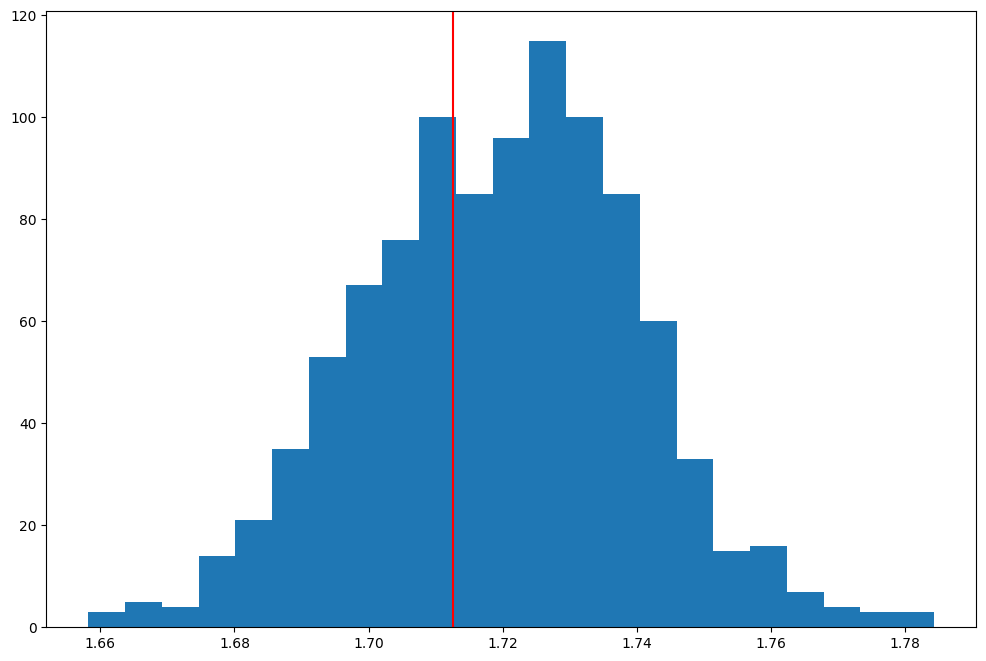

(1.7126588, 1.7205079648058617)

In [13]:
# get "true" semi-major axes from the sheet
true_smas = decameter_impactors['a'].dropna().reset_index(drop=True)
# get mc'ed semi-major axes
event_ind = 0  # index of the event to check

# filter outliers to make the histogram a bit easier to see
outlier_lb = -20  # define these to be the bounds for the histogram
outlier_ub = 20
filtered_array = orb_param_array_all_events[event_ind, :, 0][(orb_param_array_all_events[event_ind, :, 0] 
                                                              < outlier_ub) & (orb_param_array_all_events[event_ind, :, 0] 
                                                                               > outlier_lb)]

# plot everything
plt.figure(figsize = (12, 8))
# plot distribution of semi-major axis for all the Monte Carlo clones compared to the "true" value
plt.hist(filtered_array, bins='auto')  # plot histogram
# plot true value
plt.axvline(true_smas[event_ind], c='r')
plt.show()
# true semi major axis and median value of our 100 Monte Carlo samples, ignoring the unphysical negative semi major axes
true_smas[event_ind], np.median(filtered_array[filtered_array > 0])

Now get the $a$, $e$, $i$ values for all the events:

In [14]:
# getting the indices for a, e and i in the orbital parameters array (should be the same order as in orb_param_variables)
a_index = orb_param_variables.index('a')
e_index = orb_param_variables.index('e')
i_index = orb_param_variables.index('i')

# these will have the shape (number of events, number of Monte Carlo simulations, 3)
mc_aeis = orb_param_array_all_events[:, :, [a_index, e_index, i_index]]

Now reading in the `.dat` file for the Granvik model. The directory `granvik-model` should be in the same directory as this notebook.

**NOTES**:
1. Get the model from the dropbox if you want to use locally!
2. The line $\left(a, e, i, H\right)$ = $\left(2.350, 0.980, 170.000, 15.605\right)$ in the `gmb_model.dat` and `gmb_model-noheader.dat` files has a typo; should be $15.625$ in place of $15.605$

In [15]:
# defining the granvik columns manually 
# (could figure out how to get pandas to read this automatically in the dat file that actually has headers)
granvik_columns = ['sma', 'ecc', 'inc', 'Hmag', 'number', 'rel_dnumber', 
                   'nu6_prob', '5/2_prob', '2/1_prob', 'HUN_prob', '3/1_prob', 'PHO_prob', 'JFC_prob', 
                   'nu6_sigma', '5/2_sigma', '2/1_sigma', 'HUN_sigma', '3/1_sigma', 'PHO_sigma', 'JFC_sigma', 
                   'pv<0.1', '0.1<pv<0.3', 'sig', 'albedo_cat', 'collprob', 'MOID']

# read in the granvik file
granvik_model = pd.read_csv('granvik-model/gmb_model-noheader.dat', delim_whitespace=True, 
                            skip_blank_lines=True, header=None, float_precision='high')
granvik_model.columns = granvik_columns  # columns

Add $H$ from the Granvik model file to the $a$, $e$, $i$s as well. We take it to be the maximum magnitude (dimmest objects) in the Granvik model (so largest $H$), which should be $24.875$:

In [16]:
# use the maximum magnitude in the granvik model file, it's really good that it is actually uniformly sampled in H
H = np.max(granvik_model['Hmag'])
# concatenate the aies with the h values so we have AEI and H:
mc_aeihs = np.concatenate((mc_aeis, np.ones((mc_aeis.shape[0], mc_aeis.shape[1], 1)) * H), axis=2)

Get the escape region probabilities (and the corresponding uncertainties due to model degeneracy) and the $a$, $e$, $i$, $H$ values from the Granvik model:

In [17]:
# escape region probabilities and sigmas
er_prob_sigma_params = ['nu6_prob', '5/2_prob', '2/1_prob', 'HUN_prob', '3/1_prob', 'PHO_prob', 'JFC_prob', 
                        'nu6_sigma', '5/2_sigma', '2/1_sigma', 'HUN_sigma', '3/1_sigma', 'PHO_sigma', 'JFC_sigma']
er_probs_sigmas = granvik_model[er_prob_sigma_params]

# a, e, i, H values
granvik_params = ['sma', 'ecc', 'inc', 'Hmag']
granvik_aeihs = granvik_model[granvik_params]

Interpolate the Granvik file for intermediate values of the parameter space; try interpolation with nearest-neighbours, linear radial basis function and rectilinear grid with cubic splines:

First try using basic nearest-neighbours interpolation in $N$ dimensions (this is fastest and runs into the fewest problems but is also probably less accurate):

In [18]:
# interpolated probabilities/sigmas drawn from the granvik model
# with the shape (number of escape region probabilities/sigmas, number of events, number of MC samples)
interp_probs_nn = np.zeros((len(er_probs_sigmas.columns), len(impactor_state_vectors), n_monte_carlo_samples))

# perform the interpolation
for i, column in tqdm(enumerate(er_probs_sigmas.columns)):
    # build the interpolator for each escape region probability/sigma
    # rescale since the data aren't evenly sampled and the scales are different for all of them
    nn_interpolator = scipy.interpolate.NearestNDInterpolator(np.array(granvik_aeihs), np.array(er_probs_sigmas[column]), rescale=True)
    # now interpolate every event
    # print(column)
    for j, event_samples in enumerate(mc_aeihs):
        # event_samples is (number of mc samples, 4) array of all the MC samples for a given even
        # print(event_samples)

        # convert nan to 0 inplace (this is just a placeholder until I figure out what to do with the nan values later
        # as nearest neighbour interpolation doesn't like nans
        np.nan_to_num(event_samples, copy=False, nan=0.)

        # print(nn_interpolator(event_samples))
        # perform the interpolation
        interp_probs_nn[i, j] = nn_interpolator(event_samples)

14it [00:02,  5.48it/s]


Try with linear radial basis function (cubic spline/thin plate spline doesn't work because of repeat values):

In [19]:
# rbf_kernel = 'linear'  # cubic gives singular matrix because of repeat values, adding epsilon doesn't fix it either so go with linear

# # interpolated probabilities and sigmas drawn from the granvik model
# # with the shape (number of escape region probabilities/sigmas, number of events, number of MC samples)
# interp_probs_linear_rbf = np.zeros((len(er_probs_sigmas.columns), len(impactor_state_vectors), n_monte_carlo_samples))

# # nearest neighbours to perform interpolation with (don't need all of them since it's a huge file and also speeds it up by a lot
# n_neighbors = 1e3  # 5e3 takes like 5 minutes per escape region, 1e3 takes about 8-10 seconds per escape region

# # perform the interpolation
# for i, column in tqdm(enumerate(er_probs_sigmas.columns)):
#     # build the interpolator for each escape region probability/sigma
#     # rescale since the data aren't evenly sampled and the scales are different for all of them
#     linear_rbf_interpolator = scipy.interpolate.RBFInterpolator(np.array(granvik_aeihs), np.array(er_probs_sigmas[column]), 
#                                                                 neighbors=n_neighbors, kernel=rbf_kernel)
#     # now interpolate every event
#     for j, event_samples in enumerate(mc_aeihs):
#         # event_samples is (number of mc samples, 4) array of all the MC samples for a given even
#         # print(event_samples)

#         # convert nan to 0 inplace (this is just a placeholder until I figure out what to do with the nan values later...)
#         # np.nan_to_num(event_samples, copy=False, nan=0.)
        
#         # perform the interpolation
#         interp_probs_linear_rbf[i, j] = linear_rbf_interpolator(event_samples)

Now try interpolating using a rectilinear grid with cubic splines:

Construct a rectilinear grid from the Granvik model using the bounds given in the file

In [20]:
rectgrid_method = 'cubic'  # use cubic splines for the rectilinear grid interpolation

# get the grid points in a, e, i, H from the granvik model
granvik_smas = np.sort(np.unique(granvik_aeihs['sma']))
granvik_eccs = np.sort(np.unique(granvik_aeihs['ecc']))
granvik_incs = np.sort(np.unique(granvik_aeihs['inc']))
granvik_Hs = np.sort(np.unique(granvik_aeihs['Hmag']))

# meshgrid to construct the rectilinear grid with
xx, yy, zz, ww = np.meshgrid(granvik_smas, granvik_eccs, granvik_incs, granvik_Hs)

# not sure why i need to switch i and j here in this list comprehension construction, but I do...
# this was an issue in summer 2023 as well actually

# constructing the 4-d rectilinear grid with bounds given by the granvik model
grid_df = pd.DataFrame(np.array([(xx[j, i, k, l], yy[j, i, k, l], zz[j, i, k, l], ww[j, i, k, l]) 
              for i in range(0, len(granvik_smas)) 
              for j in range(0, len(granvik_eccs)) 
              for k in range(0, len(granvik_incs)) 
              for l in range(0, len(granvik_Hs))]), columns = granvik_params)

Now use the probability/sigma from the granvik model if the grid point is in the file, and inpute $0$ if the grid point is not in the file:

In [21]:
# probabilities/sigmas for the rectilinear grid 
# use the probability/sigma from the granvik model if grid point is in the file
# otherwise impute 0 if the grid value is not in the granvik model file

# create dataframe with indicator of whether the grid point exists in the granvik model file as well
indicator_df = pd.merge(grid_df, granvik_aeihs, on=granvik_params, how='left', indicator='Exist')

# create array of escape region probabilities/sigmas with the shape (number of grid points, number of escape regions)
probs = np.zeros((len(grid_df), len(er_prob_sigma_params)))
# use probability from granvik model if the indicator notes that the grid point is in the granvik file, and leave it as 0 otherwise
probs[np.where(indicator_df['Exist'] == 'both')] = er_probs_sigmas
# create final dataframe with all grid points and corresponding escape region probabilities/sigmas
grid_probs = pd.concat((indicator_df, pd.DataFrame(probs, columns = er_prob_sigma_params)), axis=1)

Optional: Perform the rectilinear grid interpolation using cubic splines, iterating over every escape region probability/sigma -- skip this cell if the interpolated probabilities have been run and saved previously:

This takes about $8$ minutes:

In [22]:
# # interpolated probabilities/sigmas drawn from the granvik model
# # with the shape (number of escape regions, number of events, number of MC samples)
# interp_probs_rectgrid_mc = np.zeros((len(er_probs_sigmas.columns), len(impactor_state_vectors), n_monte_carlo_samples))

# for i, column in tqdm(enumerate(er_probs_sigmas.columns)):
#     # get the probability/sigma for the given escape region
#     column_prob = np.array(grid_probs[column]).reshape(len(granvik_smas), len(granvik_eccs), len(granvik_incs), len(granvik_Hs))
#     # build the interpolator for the given escape region probability/sigma using cubic splines
#     # fill any values outside the grid with nans
#     rectgrid_interpolator_mc = scipy.interpolate.RegularGridInterpolator((granvik_smas, granvik_eccs, granvik_incs, granvik_Hs), column_prob, 
#                                                                       method=rectgrid_method, bounds_error=False, fill_value=np.nan)
#     # now interpolate all mc samples for every event
#     for j, event_samples in enumerate(mc_aeihs):
#         # event_samples is (number of mc samples, 4) array of all the MC samples for a given event
#         interp_probs_rectgrid_mc[i, j] = rectgrid_interpolator_mc(event_samples)                

Optional: Save the interpolated probabilities/sigmas as a `.npy` file:

In [23]:
# np.save('interp_probs_sigmas_mc.npy', interp_probs_rectgrid_mc)  # save as a .npy file

Optional: Read in `.npy` file for the probabilities/sigmas if haven't already run the interpolator:

In [24]:
interp_probs_rectgrid_mc = np.load('interp_probs_sigmas_mc.npy')  # get the interpolated probabilities/sigmas

Test interpolation of RBF w/ linear, NN, rectilinear grid w/ cubic spline for `nu6` probability for the first event's MC samples (should be chelyabinsk):

In [25]:
event_ind_interp_test = 0  # event to check
er = 'nu6_prob'  # escape region probability/sigma to check

# set up nu6_prob for rectgrid interpolator since it's different from the other interpolators
nu6_prob = np.array(grid_probs[er]).reshape(len(granvik_smas), len(granvik_eccs), len(granvik_incs), len(granvik_Hs))
rectgrid_interpolator_test = scipy.interpolate.RegularGridInterpolator((granvik_smas, granvik_eccs, granvik_incs, granvik_Hs), nu6_prob, 
                                          method=rectgrid_method, bounds_error=False, fill_value=np.nan)(mc_aeihs[event_ind_interp_test])
# nearestnd and rbf interpolators work fine like this
nearestnd_interpolator_test = scipy.interpolate.NearestNDInterpolator(np.array(granvik_aeihs), np.array(er_probs_sigmas[er]), 
                                                                      rescale=True)(mc_aeihs[event_ind_interp_test])
# rbf_interpolator_test = scipy.interpolate.RBFInterpolator(np.array(granvik_aeihs), np.array(er_probs_sigmas[er]), 
#                                                      neighbors=n_neighbors, kernel=rbf_kernel)(mc_aeihs[event_ind_interp_test])

In [26]:
rectgrid_interpolator_test, nearestnd_interpolator_test# , rbf_interpolator_test

(array([0.79270212, 0.78556069, 0.78383916, 0.79111827, 0.77642254,
        0.78246045, 0.79037275, 0.78198341, 0.79523089, 0.79368805,
        0.78819132, 0.79368766, 0.78828674, 0.79442829, 0.80218477,
        0.78237089, 0.78994038, 0.78225302, 0.79369689, 0.78790281,
        0.79458063, 0.78515895, 0.7836752 , 0.79648511, 0.78554826,
        0.79677592, 0.79154234, 0.79358915, 0.79319449, 0.79055021,
        0.80026654, 0.77858003, 0.79234082, 0.79473708, 0.78257865,
        0.78674084, 0.80196505, 0.79137148, 0.78486745, 0.78875643,
        0.78354373, 0.78971578, 0.7912768 , 0.79650337, 0.77743867,
        0.78931412, 0.78677948, 0.78810789, 0.79082824, 0.77763699,
        0.79067112, 0.78691501, 0.78710623, 0.79323525, 0.78997867,
        0.78727102, 0.78814665, 0.78877312, 0.79057132, 0.79184019,
        0.79349667, 0.78695928, 0.78114081, 0.79181276, 0.78719116,
        0.79439009, 0.78016218, 0.78582542, 0.79522215, 0.78738942,
        0.78256684, 0.78807179, 0.78139572, 0.78

Plot the interpolated probabilities:

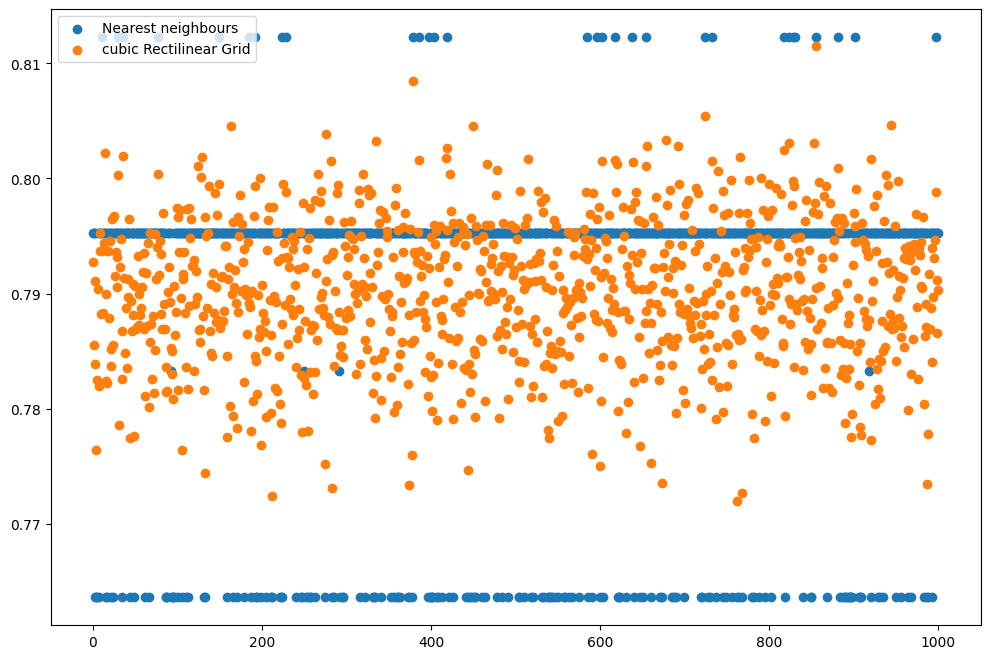

In [27]:
n_test_interp_pts = np.linspace(0, n_monte_carlo_samples, n_monte_carlo_samples)

plt.figure(figsize = (12, 8))
# plt.scatter(n_test_interp_pts, rbf_interpolator_test, label = f'{rbf_kernel} RBF')
plt.scatter(n_test_interp_pts, nearestnd_interpolator_test, label = 'Nearest neighbours')
plt.scatter(n_test_interp_pts, rectgrid_interpolator_test, label = f'{rectgrid_method} Rectilinear Grid')
plt.legend()

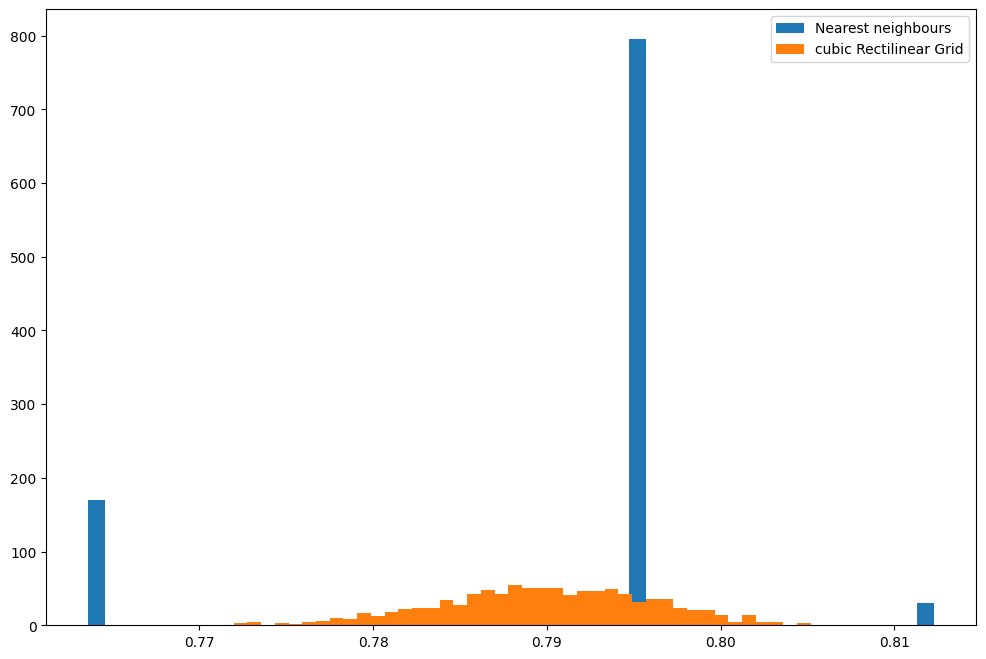

In [28]:
n_bins = 50  # number of bins

plt.figure(figsize = (12, 8))
# plt.hist(rbf_interpolator_test, bins='auto', label = f'{rbf_kernel} RBF')
# bins = 'auto' causes issues if the values are too disparate since there's too many bins I think
plt.hist(nearestnd_interpolator_test, bins=n_bins, label = 'Nearest neighbours')
plt.hist(rectgrid_interpolator_test, bins=n_bins, label = f'{rectgrid_method} Rectilinear Grid')
plt.legend()

All methods generally agree, RBF seems to like intermediate values more than nearestND and rectgrid though (although it's also probably the least accurate one)

In [29]:
# Linear N-dimensional Interpolation hangs
# scipy.interpolate.LinearNDInterpolator(np.array(granvik_aeihs), np.array(er_probs_sigmas['nu6_prob']), fill_value=np.nan, rescale=True)

Plot the interpolated probabilities and sigmas from the rectilinear grid cubic spline method for all $7$ escape regions for every event on the same plot, and save the figures:

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:12<00:00,  1.16it/s]


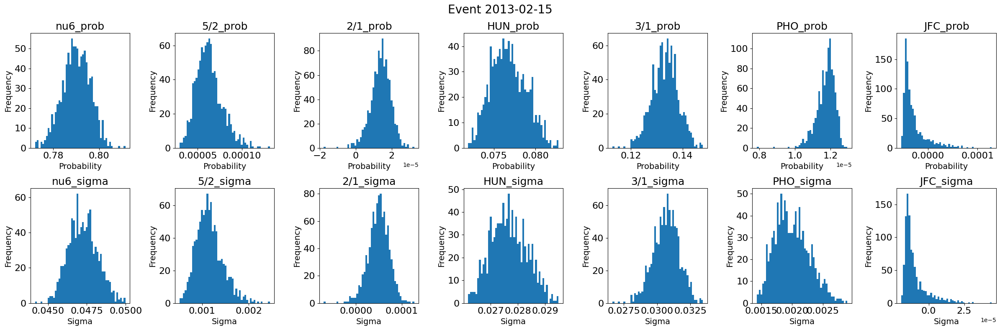

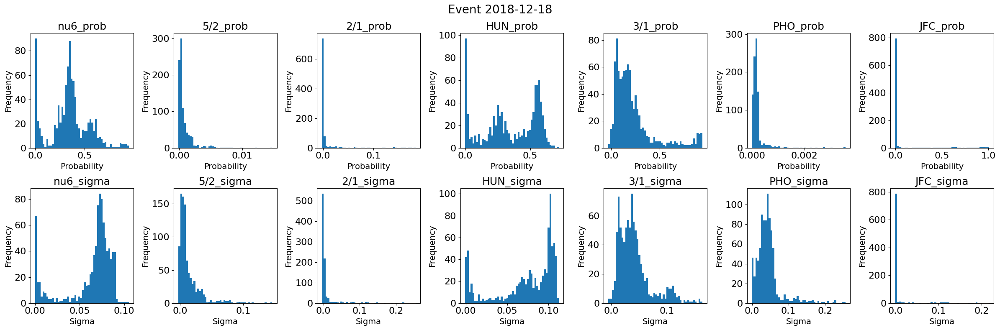

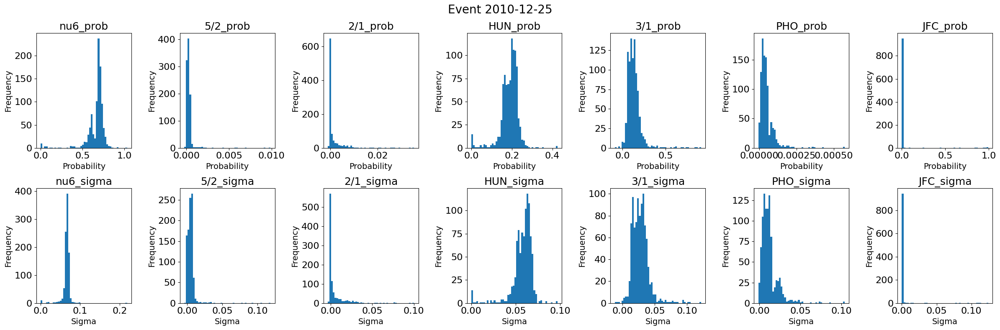

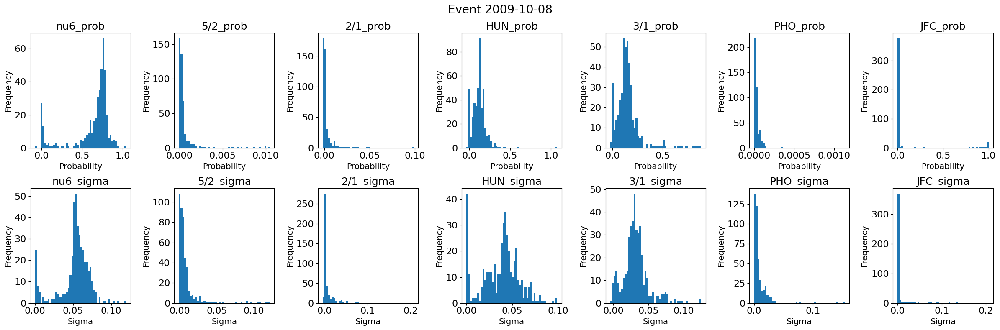

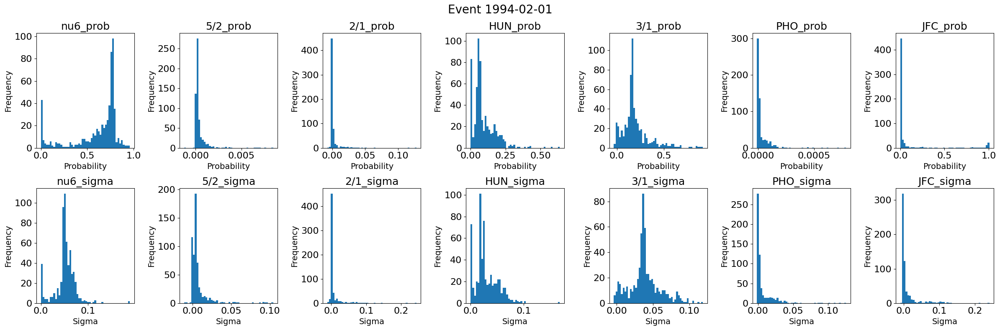

...

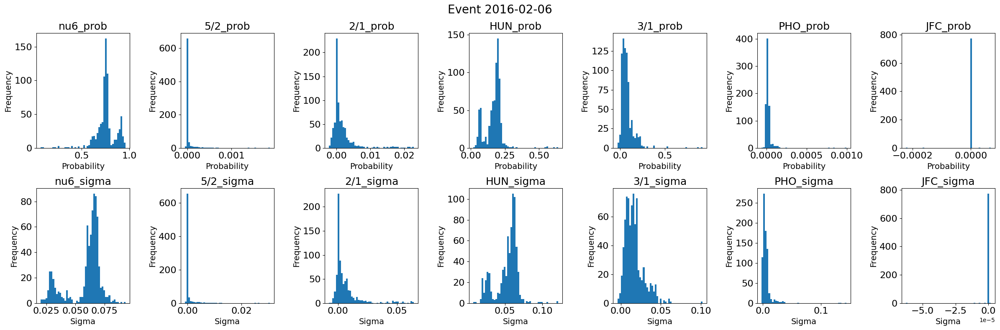

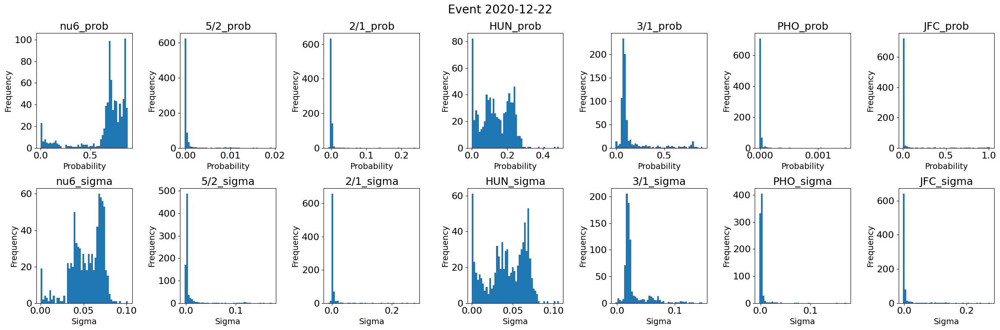

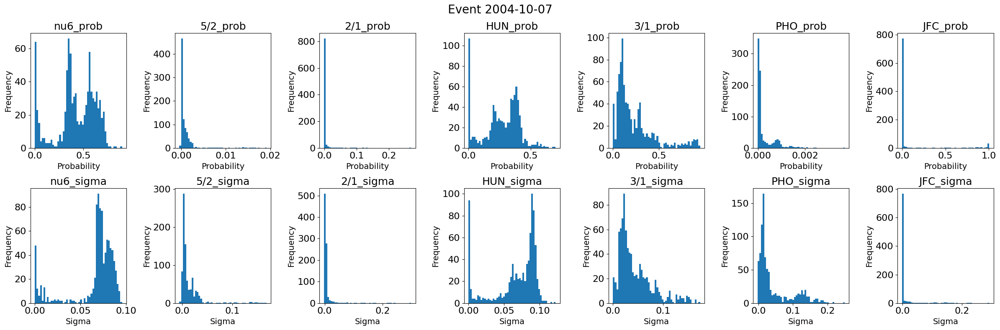

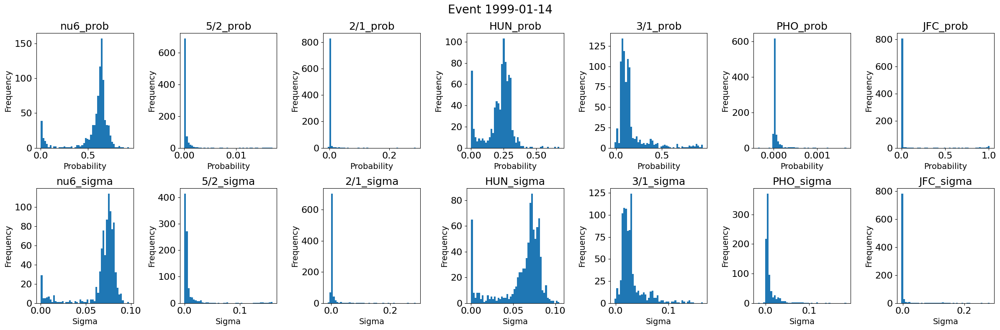

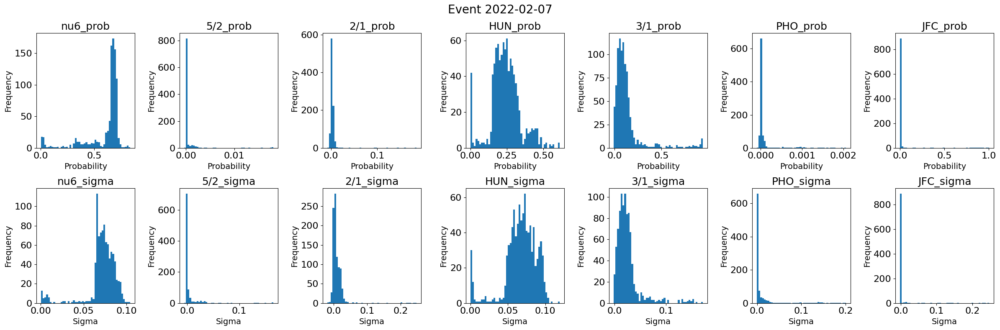

In [30]:
nrows = 2  # number of rows in each plot
ncols = 7  # number of columns in plot
n_bins = 50  # number of bins in the histogram

# iterate over every event, plotting histograms for all the escape region probabilities and sigmas
for event_ind_interp in tqdm(range(0, len(impactor_state_vectors))):
    # create the plot
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize = (24, 8), dpi=100)  # make figure with subplots
    # plot the distirbution of all the probabilities/sigmas in a loop
    for i, param in enumerate(er_prob_sigma_params):
        prob_sigma = interp_probs_rectgrid_mc[i, event_ind_interp] # these are the probabilities/sigmas for all the mc samples for that event
        # i//ncols, i%ncols indexes the subplot axes: // is integer division (floor), % is modulus
        # plot histogram
        ax[i//ncols, i%ncols].hist(prob_sigma, bins=n_bins, label = prob_sigma)
        # set ylabel
        ax[i//ncols, i%ncols].set_ylabel('Frequency', fontsize=14)
        # set title
        ax[i//ncols, i%ncols].set_title(param, fontsize=18)
        # set axis tick fontsize
        ax[i//ncols, i%ncols].tick_params(axis='both', which='major', labelsize=16)
        ax[i//ncols, i%ncols].tick_params(axis='both', which='minor', labelsize=12)
        # set xlabel as either probability or sigma depending on parameter
        if 'prob' in param:
            ax[i//ncols, i%ncols].set_xlabel('Probability', fontsize=14)
        elif 'sigma' in param:
            ax[i//ncols, i%ncols].set_xlabel('Sigma', fontsize=14)
    # get the date of the event
    event_date = pd.to_datetime(impactor_state_vectors['Time'], 
                                format='%Y%m%d-%H%M%S.%f').dt.strftime('%Y-%m-%d').iloc[event_ind_interp]
    # title
    fig.suptitle('Event ' + event_date, fontsize=20)
    # tight layout
    plt.tight_layout()
    # save
    plt.savefig(f'dda_talk_plots/er_probs_sigmas_event_{event_date}.png')

Get the $a$, $e$, $i$ from Borovicka et al. (2013) and run it through the Granvik model, then compare to the Chelyabinsk ER probability/sigma plots to see if it agrees with what we get from our pipeline; should be a validation step.

$H$ is given as $26.17$ in pp. $5$ of the correspondoing supplementary information paper but that is above the maximum $H$ sampled by the Granvik model; since the interpolator gives `nan` in that case we use the maximum $H$ in the Granvik file instead, as the Monte Carlo samples do as well

In [31]:
# aei values are taken from Table 2 of Borovicka et al. (2013)
# H absolute magnitude is the same used for the Monte Carlo samples (maximum H value in the Granvik file)
borovicka_aeih = np.array([1.72, 0.571, 4.98, H])     

Run it through the interpolated Granvik model and then compare to the Chelyabinsk ER probability/sigma plots:

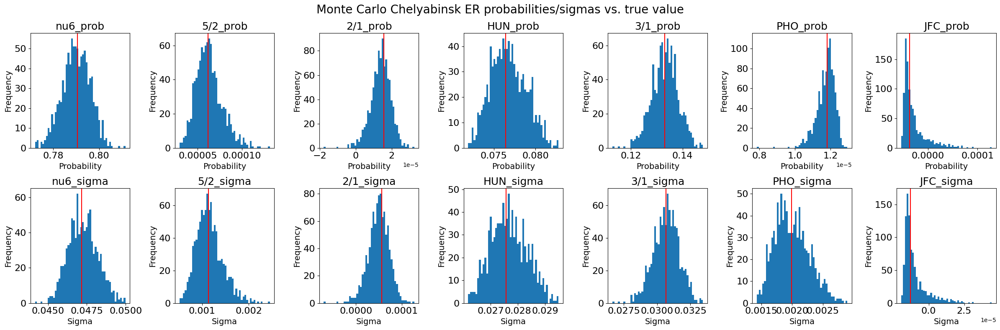

In [32]:
chel_index = 0  # chelyabinsk index

# make figure with subplots
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize = (24, 8), dpi=100)  

# plot the distirbution of all the probabilities/sigmas in a loop
for i, param in enumerate(er_probs_sigmas.columns):
    # get the er probability/sigma
    column_prob = np.array(grid_probs[param]).reshape(len(granvik_smas), len(granvik_eccs), len(granvik_incs), len(granvik_Hs))
    # build the rectilinear grid interpolator for that parameter
    rectgrid_interpolator = scipy.interpolate.RegularGridInterpolator((granvik_smas, granvik_eccs, granvik_incs, granvik_Hs), column_prob, 
                                                                      method=rectgrid_method, bounds_error=False, fill_value=np.nan)
    # these are the probabilities/sigmas for all the chelyabinsk mc samples
    mc_prob_sigma = rectgrid_interpolator(mc_aeihs[chel_index])
    # this is the probability/sigma for the "true" value derived from the Borovicka et al. (2013) aeih values
    borovicka_prob_sigma = rectgrid_interpolator(borovicka_aeih)
    
    # plotting:
    # i//ncols, i%ncols indexes the subplot axes: // is integer division (floor), % is modulus
    # plot histogram of the distribution of mc samples
    ax[i//ncols, i%ncols].hist(mc_prob_sigma, bins=n_bins, label = param)
    # plot the "true" value derived from the Borovicka et al. 2013 aeih values
    # print(borovicka_prob_sigma)
    ax[i//ncols, i%ncols].axvline(x=borovicka_prob_sigma, color='r')
    # set ylabel
    ax[i//ncols, i%ncols].set_ylabel('Frequency', fontsize=14)
    # set title
    ax[i//ncols, i%ncols].set_title(param, fontsize=18)
    # set axis tick fontsize
    ax[i//ncols, i%ncols].tick_params(axis='both', which='major', labelsize=16)
    ax[i//ncols, i%ncols].tick_params(axis='both', which='minor', labelsize=12)
    # set xlabel as either probability or sigma depending on parameter
    if 'prob' in param:
        ax[i//ncols, i%ncols].set_xlabel('Probability', fontsize=14)
    elif 'sigma' in param:
        ax[i//ncols, i%ncols].set_xlabel('Sigma', fontsize=14)
        
# title
fig.suptitle('Monte Carlo Chelyabinsk ER probabilities/sigmas vs. true value', fontsize=20)
# tight layout
plt.tight_layout()
# save figure
plt.savefig('dda_talk_plots/chelyabinsk_er_prob_sigma_true.png')

And make a single aggregate plot of all the ER probabilities/sigmas for every single impactor:

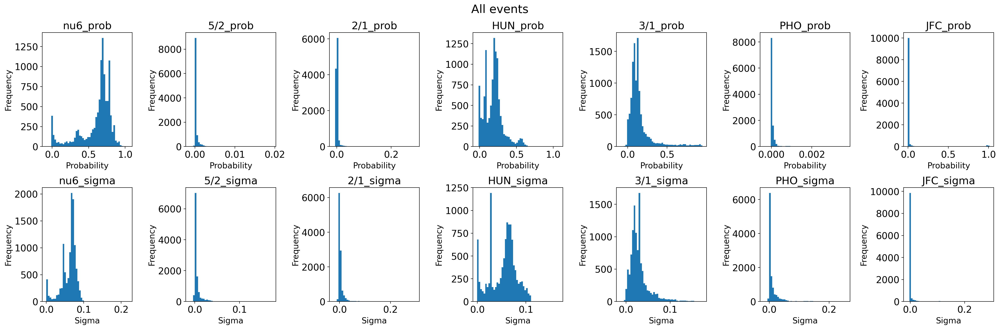

In [33]:
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize = (24, 8), dpi=200)  # make figure
# plot in a loop
for i, param in enumerate(er_prob_sigma_params):
    prob_sigma = interp_probs_rectgrid_mc[i].flatten()  # probability/sigma for all mc samples for ALL EVENTS
    # plot histogram
    ax[i//ncols, i%ncols].hist(prob_sigma, bins=n_bins, label = prob_sigma, density=False)
    # set ylabel
    ax[i//ncols, i%ncols].set_ylabel('Frequency', fontsize=14)
    # set title
    ax[i//ncols, i%ncols].set_title(param, fontsize=18)
    # set axis tick fontsize
    ax[i//ncols, i%ncols].tick_params(axis='both', which='major', labelsize=16)
    ax[i//ncols, i%ncols].tick_params(axis='both', which='minor', labelsize=12)
    # set xlabel as either probability or sigma depending on parameter
    if 'prob' in param:
        ax[i//ncols, i%ncols].set_xlabel('Probability', fontsize=14)
    elif 'sigma' in param:
        ax[i//ncols, i%ncols].set_xlabel('Sigma', fontsize=14)
# set title
fig.suptitle('All events', fontsize=20)
# tight layout
plt.tight_layout()
# save
plt.savefig('dda_talk_plots/er_probs_sigmas_events_all.png')

And an alternate version with all the events plotted in different colours:

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  4.88it/s]


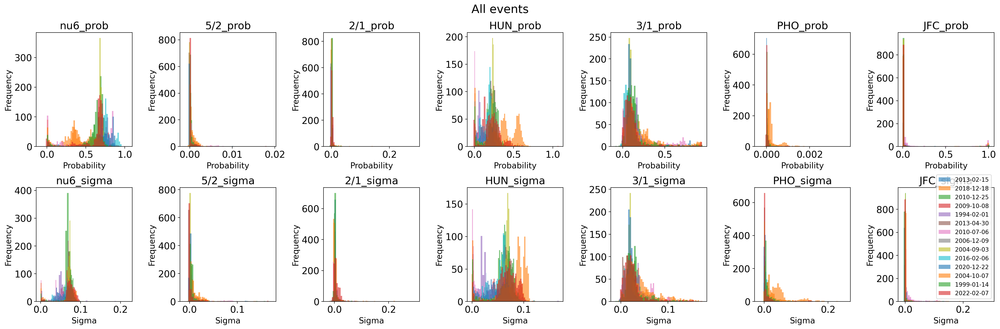

In [34]:
nrows = 2  # number of rows in each plot
ncols = 7  # number of columns in plot
n_bins = 50  # number of bins in the histogram

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize = (24, 8), dpi=200)  # make figure with subplots

# iterate over every event, plotting histograms for all the escape region probabilities and sigmas
for event_ind_interp in tqdm(range(0, len(impactor_state_vectors))):
    # get the date of the event
    event_date = pd.to_datetime(impactor_state_vectors['Time'], 
                                format='%Y%m%d-%H%M%S.%f').dt.strftime('%Y-%m-%d').iloc[event_ind_interp]
    # plot the distirbution of all the probabilities/sigmas in a loop
    for i, param in enumerate(er_prob_sigma_params):
        prob_sigma = interp_probs_rectgrid_mc[i, event_ind_interp] # these are the probabilities/sigmas for all the mc samples for that event
        # i//ncols, i%ncols indexes the subplot axes: // is integer division (floor), % is modulus
        # plot histogram
        ax[i//ncols, i%ncols].hist(prob_sigma, bins=n_bins, label = event_date, alpha=0.6)
        # set ylabel
        ax[i//ncols, i%ncols].set_ylabel('Frequency', fontsize=14)
        # set title
        ax[i//ncols, i%ncols].set_title(param, fontsize=18)
        # set axis tick fontsize
        ax[i//ncols, i%ncols].tick_params(axis='both', which='major', labelsize=16)
        ax[i//ncols, i%ncols].tick_params(axis='both', which='minor', labelsize=12)
        # set xlabel as either probability or sigma depending on parameter
        if 'prob' in param:
            ax[i//ncols, i%ncols].set_xlabel('Probability', fontsize=14)
        elif 'sigma' in param:
            ax[i//ncols, i%ncols].set_xlabel('Sigma', fontsize=14)
# legend
plt.legend()
# set title
fig.suptitle('All events', fontsize=20)
# tight layout
plt.tight_layout()
# save
plt.savefig('dda_talk_plots/er_probs_sigmas_events_all_alternate.png')

Now import `.csv` of telescopically observed NEOs from NASA small-body database (including basic asteroid parameters and physical asteroid parameters)  with $26.5 \leq H \leq 28$ (corresponding to $\sim 16$m $\geq D \geq 7.9$m with an albedo of $0.18$, as per the NEOMOD model) and condition code $\leq 5$ (around $\sim 300$ objects) and then run all their $a$, $e$, $i$ values (again setting $H$ equal to max $H$ in the Granvik model) through the interpolated Granvik model

In [35]:
# import the telescopically observed neos from NASA's small-body database
sbdb_dm_neos = pd.read_csv('telescopic_decameter_neos.csv', sep=',')
# get the a, e, i, values and use the same H as for everything else:
sbdb_aeis = np.array(sbdb_dm_neos[['a', 'e', 'i']])
# add Hs to the aei values
sbdb_aeihs = np.concatenate((sbdb_aeis, np.ones(((sbdb_aeis.shape[0]), 1)) * H), axis=1)

And perform the rectilinear grid interpolation for all the $a$, $e$, $i$, $H$ values of the telescopically observed NEOs:

In [36]:
# interpolated probabilities drawn from the granvik model, with the shape (number of escape regions, number of small bodies)
interp_probs_rectgrid_sbdb = np.zeros((len(er_probs_sigmas.columns), len(sbdb_aeihs)))

# perform the interpolation
for i, column in tqdm(enumerate(er_probs_sigmas.columns)):
    # get the probability/sigma for the given escape region
    column_prob = np.array(grid_probs[column]).reshape(len(granvik_smas), len(granvik_eccs), len(granvik_incs), len(granvik_Hs))
    # build the interpolator for the given escape region probability/sigma using cubic splines
    # fill any values outside the grid with nans
    rectgrid_interpolator_sbdb = scipy.interpolate.RegularGridInterpolator((granvik_smas, granvik_eccs, granvik_incs, granvik_Hs), column_prob, 
                                                                      method=rectgrid_method, bounds_error=False, fill_value=np.nan)
    # interpolate all the sbdb aeih samples
    interp_probs_rectgrid_sbdb[i] = rectgrid_interpolator_sbdb(sbdb_aeihs)

14it [00:04,  3.48it/s]


Plot the ER prob/sigma distribution of these events to see how they compare to the MC sample distribution of our decameter impactors:

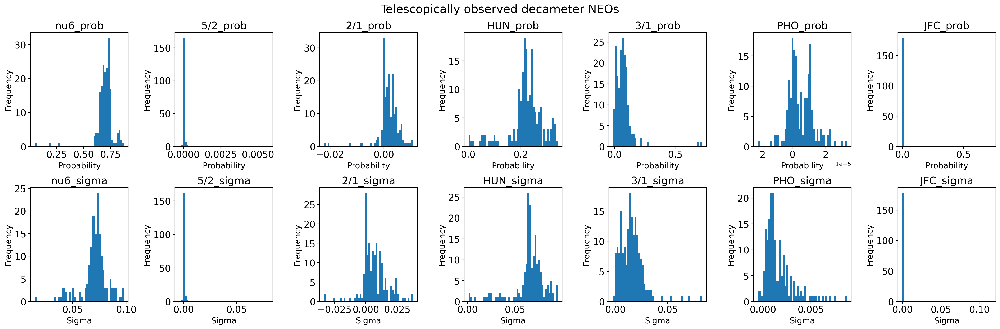

In [37]:
# make figure with subplots
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize = (24, 8), dpi=200)  

# plot the distirbution of all the sbdb probabilities/sigmas in a loop
for i, param in enumerate(er_probs_sigmas.columns):
    # plot the sbdb probabilities/sigmas
    ax[i//ncols, i%ncols].hist(interp_probs_rectgrid_sbdb[i], bins=n_bins)
    # set ylabel
    ax[i//ncols, i%ncols].set_ylabel('Frequency', fontsize=14)
    # set title
    ax[i//ncols, i%ncols].set_title(param, fontsize=18)
    # set axis tick fontsize
    ax[i//ncols, i%ncols].tick_params(axis='both', which='major', labelsize=16)
    ax[i//ncols, i%ncols].tick_params(axis='both', which='minor', labelsize=12)
    # set xlabel as either probability or sigma depending on parameter
    if 'prob' in param:
        ax[i//ncols, i%ncols].set_xlabel('Probability', fontsize=14)
    elif 'sigma' in param:
        ax[i//ncols, i%ncols].set_xlabel('Sigma', fontsize=14) 
# title
fig.suptitle('Telescopically observed decameter NEOs', fontsize=20)
# tight layout
plt.tight_layout()
# save figure
plt.savefig('dda_talk_plots/telescopic_decameter_neo_distributions.png')

Again seem to come mostly from the inner main belt belt; $\nu_6$ the most likely with some probability of Hungaria or $3/1$

Finally, plot the aggregate impactor probabilities on top of the telescopically observed probabilities:

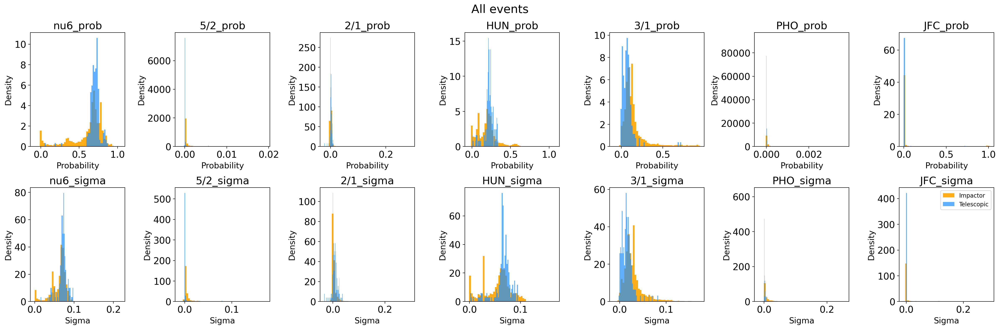

In [38]:
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize = (24, 8), dpi=200)  # make figure
# plot in a loop
for i, param in enumerate(er_prob_sigma_params):
    prob_sigma = interp_probs_rectgrid_mc[i].flatten()  # probability/sigma for all mc samples for ALL EVENTS
    # plot histograms
    ax[i//ncols, i%ncols].hist(prob_sigma, bins=n_bins, density=True, color='orange', label = 'Impactor', alpha=0.9)  # impactor
    ax[i//ncols, i%ncols].hist(interp_probs_rectgrid_sbdb[i], bins=n_bins, density=True, color='dodgerblue', label = 'Telescopic', alpha=0.7)  # telescopic
    # set ylabel
    ax[i//ncols, i%ncols].set_ylabel('Density', fontsize=14)
    # set title
    ax[i//ncols, i%ncols].set_title(param, fontsize=18)
    # set axis tick fontsize
    ax[i//ncols, i%ncols].tick_params(axis='both', which='major', labelsize=16)
    ax[i//ncols, i%ncols].tick_params(axis='both', which='minor', labelsize=12)
    # set xlabel as either probability or sigma depending on parameter
    if 'prob' in param:
        ax[i//ncols, i%ncols].set_xlabel('Probability', fontsize=14)
    elif 'sigma' in param:
        ax[i//ncols, i%ncols].set_xlabel('Sigma', fontsize=14)
# legend
plt.legend()
# set title
fig.suptitle('All events', fontsize=20)
# tight layout
plt.tight_layout()
# save
plt.savefig('dda_talk_plots/er_probs_sigmas_events_all_impactor_vs_telescopic.png')

In [39]:
import matplotlib.patches as mpatches

n_bins=50
nrows_p = 2
ncols_p = 4
er_prob_params = [r'$\nu_6$ resonance', '5:2 resonance', '2:1 resonance', 'Hungaria', '3:1 resonance', 'Phocaea', 'JFC']

fig, ax = plt.subplots(nrows=nrows_p, ncols=ncols_p, figsize = (21, 9), dpi=800)  # make figure
# plot in a loop
for i, param in enumerate(er_prob_params):
    prob = interp_probs_rectgrid_mc[i].flatten()  # probability
    # plot histogram
    ax[i//ncols_p, i%ncols_p].hist(prob, bins=n_bins, density=True, 
                                   label = 'Impactor', color='orange', alpha=0.9)  # impactor
    ax[i//ncols_p, i%ncols_p].hist(interp_probs_rectgrid_sbdb[i], bins=n_bins, density=True, 
                                   label = 'Telescopic', color='dodgerblue', alpha=0.7)  # telescopic
    # set ylabel
    ax[i//ncols_p, i%ncols_p].set_ylabel('Density', fontsize=20, weight='bold')
    # set title
    ax[i//ncols_p, i%ncols_p].set_title(param, fontsize=22, weight='bold')
    # set axis tick fontsize
    ax[i//ncols_p, i%ncols_p].tick_params(axis='both', which='major', labelsize=18)
    ax[i//ncols_p, i%ncols_p].tick_params(axis='both', length=6., width=1., which='minor', labelsize=16)
    ax[i//ncols_p, i%ncols_p].set_xlabel('Probability', fontsize=20, weight='bold')
    # set tick sizes
    ax[i//ncols_p, i%ncols_p].tick_params(axis='x', which='major', length=10., width=1.75)
    # if xlim max is greater than 1, set equal to 1
    if ax[i//ncols_p, i%ncols_p].get_xlim()[1] > 0.75:
        ax[i//ncols_p, i%ncols_p].set_xlim(left=-0.1, right=1.1)
# legend colours
orange_patch = mpatches.Patch(color='orange', label='Impactor')
blue_patch = mpatches.Patch(color='dodgerblue', label='Telescopic')
# put legend in bottom right
bottom_right_ax = ax[-1][-1]
# plot some random data
bottom_right_ax.scatter(0, 0, label = 'Impactor')
bottom_right_ax.scatter(1, 1, label = 'Telescopic')
# clear and legend
bottom_right_ax.clear()  # clears the random data I plotted previously
bottom_right_ax.set_axis_off()  # removes the XY axes
bottom_right_ax.legend(handles=[orange_patch, blue_patch], loc='center', fontsize=24)
# set title
# fig.suptitle('All events', fontsize=20)
# tight layout
plt.tight_layout()
# save
plt.savefig('dda_talk_plots/er_probs_events_all_impactor_vs_telescopic.png')

Making $a$, $e$, $i$ heatmaps of the telescopically observed decameter objects and compare them to the observed impactors:

First compute the "true" $a$, $e$, $i$ values of the observed impactors with `WMPL`:

In [41]:
# each event has a true aei
# shape (number of events, number of orbital parameters to get)
true_aeis = np.zeros((len(impactor_state_vectors), len(orb_param_variables)))

# get aeis in loop
for i, event in tqdm(impactor_state_vectors.iterrows()):
    # get state vectors
    v, t, a, o, e, zen, azim = event  # since it should be in that order in impactor_state_vectors table
    # zenith is 90 - alt
    alt = 90 - zen
    # run wmpl
    output = subprocess.run(['python3', '-m', 'wmpl.Trajectory.Orbit', '-v', f'{v}', '-t', f'{t}', '-a', f'{a}', 
                             '-o', f'{o}', '-e', f'{e}', '--azim', f'{azim}', '--alt', f'{alt}', 
                             '--vrotcorr', '--statfixed'], capture_output=True)
    # get orbital parameters from the output in the order of orb_param_variables
    # print(output)
    true_aeis[i] = np.array([np.float64(string) for param in [elem for elem in 
                                                              list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) 
                                                              if elem.startswith(tuple(orb_param_variables))] 
                             for string in param.split() if string.lstrip('-').replace('.', '').isdigit() or string =='nan'])

14it [00:24,  1.77s/it]


Optional: Save/load the true impactor $a$, $e$, $i$ values as a `.npy` file: 

In [42]:
np.save('true_impactor_aeis.npy', true_aeis)  # save as a .npy file
true_aeis = np.load('true_impactor_aeis.npy')

And get the $a$, $e$, $i$s for the impactors and for the telescopically observed objects:

In [43]:
# impactors
true_as, true_es, true_is = true_aeis.T[a_index], true_aeis.T[e_index], true_aeis.T[i_index]
# telescopically observed
sbdb_as, sbdb_es, sbdb_is = sbdb_aeis.T

Plot $a$ vs. $e$ and $a$ vs. $i$ for all the Monte Carlo samples:

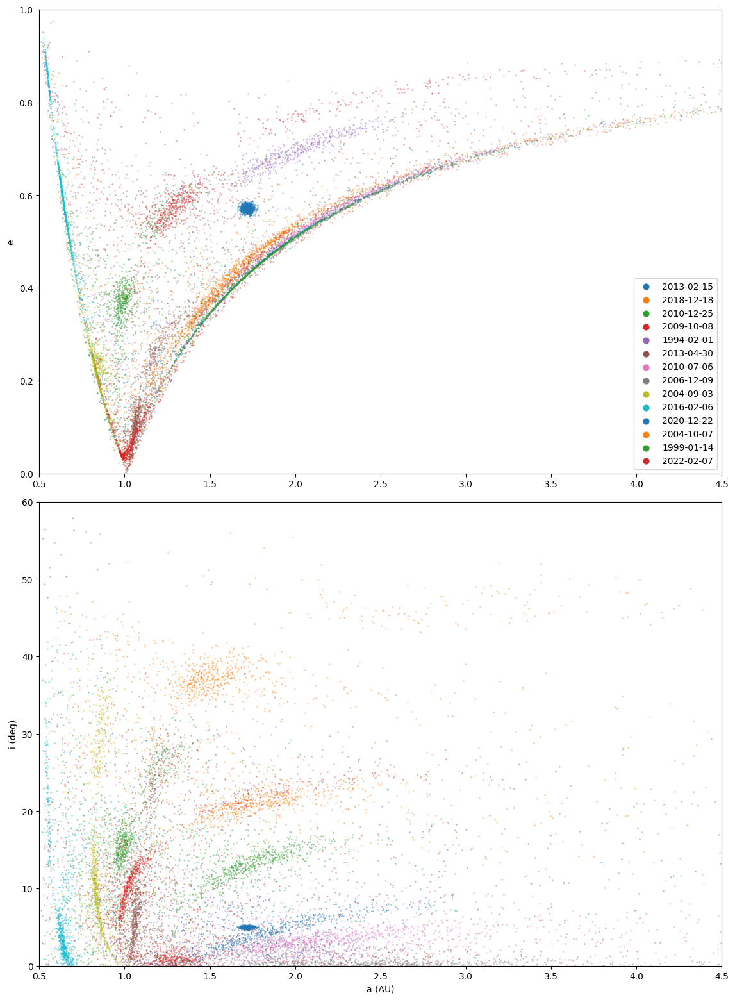

In [44]:
# Plotting:
fig = plt.figure(figsize = (12, 16))
# make subplots
ax = fig.add_subplot(111)    # The big subplot
ax1 = fig.add_subplot(211)
ax2 = fig.add_subplot(212)
# Turn off axis lines and ticks of the big subplot
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)
# get the event and plot in a loop
for index, event in enumerate(mc_aeis):
    # event a e and is
    event_as, event_es, event_is = event.T
    # get the date of the event
    event_date = pd.to_datetime(impactor_state_vectors['Time'], 
                                format='%Y%m%d-%H%M%S.%f').dt.strftime('%Y-%m-%d').iloc[index]
    # plot event
    ax1.scatter(event_as, event_es, s=0.1, label = event_date)  # a vs. e
    ax2.scatter(event_as, event_is, s=0.1, label = event_date)  # a vs. i
    # set the limits to physically reasonable quantities
    ax1.set_xlim(0.5, 4.5), ax1.set_ylim(0, 1.)  # a from 0.5 to 4.5 au, e from 0 to 1
    ax2.set_xlim(0.5, 4.5), ax2.set_ylim(0., 60.)  # a from 0.5 to 4.5 au, i from 0 to 60 degrees
    # legend
    ax1.legend(loc='lower right', markerscale=20.)
    # ax2.legend(loc='upper right', markerscale=20.)
# set x and y labels
ax.set_xlabel('a (AU)'), ax1.set_ylabel('e'), ax2.set_ylabel('i (deg)')
# tight layout
plt.tight_layout()
# save
plt.savefig('dda_talk_plots/aei_mc_samples.png')

Plot $a$ vs. $e$ and $a$ vs. $i$ for the telescopically observed decameter asteroids and compare those to the impactors, also making sure to plot lines for $q = a\left(1 - e\right)$ and $Q = a\left(1 + e\right)$, or $e = 1 - \frac{q}{a}$ and $e = \frac{Q}{a} - 1$

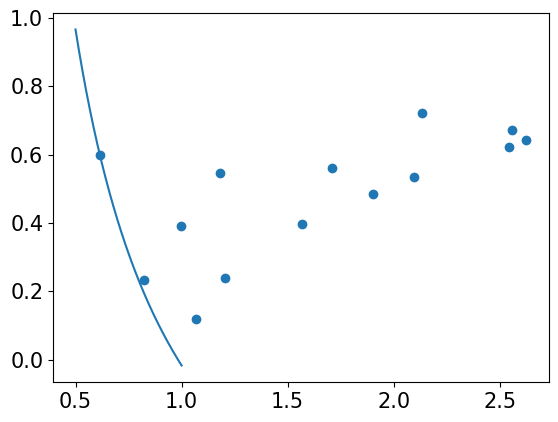

In [95]:
plt.scatter(true_as, true_es)
plt.plot(a_Q, e_Q)

In [129]:
# compute e for constant Q = q_e for a = 0.5 to 1 and q = Q_e for a = 1 to a = 4
q_earth = 0.983
Q_earth = 1.017  # earth apsides
# compute e_q and e_Q
a_q = np.linspace(1., 3.5, int(1e4))
a_Q = np.linspace(0.5, 1., int(1e4))

e_q = 1. - q_earth/a_q
e_Q = Q_earth/a_Q - 1.

plt.rcParams['font.weight'] = 'normal'
fig = plt.figure(figsize = (21, 9), dpi=800)
# make subplots
ax = fig.add_subplot(111)    # The big subplot
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
# Turn off axis lines and ticks of the big subplot
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)
# impactors
ax1.scatter(true_as, true_es, s=30, c='orange', label = 'Impactor')  # a vs. e
ax2.scatter(true_as, true_is, s=30, c='orange', label = 'Impactor')  # a vs. i
# telescopically observed
ax1.scatter(sbdb_as, sbdb_es, s=5., c='dodgerblue', label = 'Telescopic')  # a vs. e
ax2.scatter(sbdb_as, sbdb_is, s=5., c='dodgerblue', label = 'Telescopic')  # a vs. i
# plot the e_q and e_Q lines on the a vs. e plot
ax1.plot(a_q, e_q, c='r', alpha=0.5)
ax1.plot(a_Q, e_Q, c='r', alpha=0.5)
ax1.annotate(f'Q = {q_earth} AU', xy=(0.45, 0.32), xycoords='data', rotation=284, fontsize=20, color='r', weight='bold')
ax1.annotate(f'q = {Q_earth} AU', xy=(1.6, 0.32), xycoords='data', rotation=28, fontsize=20, color='r', weight='bold')
# earth
ax1.scatter(x=1.0, y=0.017, s=60, c='red')  # a vs. e
ax2.scatter(x=1.0, y=5e-5, s=60, c='red')  # a vs. i
# label
ax1.set_xlabel('a (AU)', fontsize=20, weight='bold')
ax2.set_xlabel('a (AU)', fontsize=20, weight='bold')
ax1.set_ylabel('e', fontsize=20, weight='bold')
ax2.set_ylabel('i (deg)', fontsize=20, weight='bold')
# axis ticks
ax1.tick_params(axis='both', which='major', labelsize=20)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax1.tick_params(axis='both', which='minor', labelsize=15)
ax2.tick_params(axis='both', which='minor', labelsize=15)
# tick lengths
ax1.tick_params('both', length=12, width=2., which='major')
ax1.tick_params('both', length=6, width=1., which='minor')
ax2.tick_params('both', length=12, width=2., which='major')
ax2.tick_params('both', length=6, width=1., which='minor')
# get x, y limits for the next plot
ax1.set_xlim(right=3.)  # maximum SMA of 3 AU
ax1.set_ylim(top=1.)  # maximum eccentricity of 1
aei_ax1_xlim, aei_ax1_ylim = ax1.get_xlim(), ax1.get_ylim()
# same x limits
ax2.set_xlim(aei_ax1_xlim) 
ax2.set_ylim(top=40.)  # maximum inclination of 40 degrees
aei_ax2_xlim, aei_ax2_ylim = ax2.get_xlim(), ax2.get_ylim()
# show minor
ax1.minorticks_on()
ax2.minorticks_on()
# set minor ticks
ax1.xaxis.set_minor_locator(ticker.MultipleLocator(0.25))
ax2.xaxis.set_minor_locator(ticker.MultipleLocator(0.25))
# eccentricity and inclination plots
ax1.yaxis.set_minor_locator(ticker.MultipleLocator(0.1))
ax2.yaxis.set_minor_locator(ticker.MultipleLocator(5.))
# legend
lgnd = ax1.legend(loc='lower right', fontsize=20)
# set the sizes
lgnd.legend_handles[0]._sizes = [100.]
lgnd.legend_handles[1]._sizes = [100.]
# tight layout
plt.tight_layout()
# save
plt.savefig('dda_talk_plots/aei_telescopic_vs_impactors.png')

Plot the Monte Carlo samples for a single event as an example and draw the lines:

In [46]:
event_index = 2  # event to plot

# Plotting:
fig = plt.figure(figsize = (21, 9), dpi=800)
# make subplots
ax = fig.add_subplot(111)    # The big subplot
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
# Turn off axis lines and ticks of the big subplot
ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)
# plot event mc samples
event_as, event_es, event_is = mc_aeis[event_index].T
# plot event mc samples
ax1.scatter(event_as, event_es, s=0.5, c='black')  # a vs. e
ax2.scatter(event_as, event_is, s=0.5, c='black')  # a vs. i
# plot true value
ax1.scatter(true_as[event_index], true_es[event_index], s=60., c='darkorange')
ax2.scatter(true_as[event_index], true_is[event_index], s=60., c='darkorange')
# plot the e_q and e_Q lines on the a vs. e plot
ax1.plot(a_q, e_q, c='r', alpha=0.5)
ax1.plot(a_Q, e_Q, c='r', alpha=0.5)
ax1.annotate(f'Q = {q_earth} AU', xy=(0.45, 0.32), xycoords='data', rotation=284, fontsize=20, color='r', weight='bold')
ax1.annotate(f'q = {Q_earth} AU', xy=(1.6, 0.32), xycoords='data', rotation=28, fontsize=20, color='r', weight='bold')
# ax1.annotate(f'Q = {q_earth} AU', xy=(0.52, 0.32), xycoords='data', rotation=282, fontsize=16, color='r')
# ax1.annotate(f'q = {Q_earth} AU', xy=(1.6, 0.32), xycoords='data', rotation=37, fontsize=16, color='r')
# earth
ax1.scatter(x=1.0, y=0.017, s=60, c='red')  # a vs. e
ax2.scatter(x=1.0, y=5e-5, s=60, c='red')  # a vs. i
# set the limits to physically reasonable quantities
ax1.set_xlim(aei_ax1_xlim), ax1.set_ylim(aei_ax1_ylim)
ax2.set_xlim(aei_ax2_xlim), ax2.set_ylim(aei_ax2_ylim)
# ax1.set_xlim(right=3.5), ax2.set_xlim(right=3.5)
# legend
# ax1.legend(loc='lower right', markerscale=20.)
# ax2.legend(loc='upper right', markerscale=20.)
# label
ax1.set_xlabel('a (AU)', fontsize=20, weight='bold')
ax2.set_xlabel('a (AU)', fontsize=20, weight='bold')
ax1.set_ylabel('e', fontsize=20, weight='bold')
ax2.set_ylabel('i (deg)', fontsize=20, weight='bold')
# axis ticks
ax1.tick_params(axis='both', which='major', labelsize=20)
ax2.tick_params(axis='both', which='major', labelsize=20)
ax1.tick_params(axis='both', which='minor', labelsize=15)
ax2.tick_params(axis='both', which='minor', labelsize=15)
# tick lengths
ax1.tick_params('both', length=12, width=2., which='major')
ax1.tick_params('both', length=6, width=1., which='minor')
ax2.tick_params('both', length=12, width=2., which='major')
ax2.tick_params('both', length=6, width=1., which='minor')
# show minor
ax1.minorticks_on()
ax2.minorticks_on()
# set minor ticks
ax1.xaxis.set_minor_locator(ticker.MultipleLocator(0.25))
ax2.xaxis.set_minor_locator(ticker.MultipleLocator(0.25))
# eccentricity and inclination plots
ax1.yaxis.set_minor_locator(ticker.MultipleLocator(0.1))
ax2.yaxis.set_minor_locator(ticker.MultipleLocator(5.))
# tight layout
plt.tight_layout()
# save
plt.savefig('dda_talk_plots/aei_mc_sample_single_event.png')

The big outlier with high SMA is the 2018 event; very low SMA is the 2016 event

#### Comparing impactor $aei$-distribution to telescopic $aei$-distribution:

A $p$-dimensional multivariate Gaussian-distributed vector $\mathbf{X} \sim \mathcal{N}\left(\boldsymbol{\mu},\mathbf{C}\right)$ can be transformed into the univariate $\chi^2$-distributed squared Mahalanobis distance $Z \sim \chi^2\left(p\right)$ according to:
\begin{equation}
	Z = \left(\mathbf{X} - \boldsymbol{\mu}\right)^T\,\mathbf{C}^{-1}\,\left(\mathbf{X} - \boldsymbol{\mu}\right)
\end{equation}
where $\boldsymbol{\mu}$ is the $p \times 1$ sample mean and $\mathbf{C}$ is the $p \times p$ sample covariance. The distribution of $Z$ can be compared to a reference $\chi^2$ distribution to determine whether the original $p$-dimensional distribution is Gaussian. We thus first determine whether the telescopic decameter $aei$ $3$-D distribution is in general Gaussian, using the method described above. 

This is to determine whether our $3$-D distributions are Gaussian, since we can then estimate the distributions parameterically allowing for more powerful ways of comparing them (using something like the KL-divergence)

In [47]:
# get impactor aeis in the form that we need
impactor_aeis = np.vstack((true_as, true_es, true_is)).T
impactor_as, impactor_es, impactor_is = true_as, true_es, true_is  # rename these to be consistent

ndim = 3  # distributions are trivariate (a, e, i) so chi2 distribution will have 3 degrees of freedom

# sbdb_aeis and impactor_aeis are N x 3 matrices
# compute the means and covariances of the telescopic and impactor sets of samples
mus_telescopic = np.reshape(np.mean(sbdb_aeis, axis=0), (len(sbdb_aeis.T), ))  # mus is a 3x1 vector
mus_impactor = np.reshape(np.mean(impactor_aeis, axis=0), len(impactor_aeis.T, ))
cov_telescopic = np.cov(sbdb_aeis.T)  # cov is a 3x3 matrix
cov_impactor = np.cov(impactor_aeis.T)
# convert 3-D aei distribution to 1-D distribution of mahalanobis distances Z from the mean by computing the mahalanobis distances of all the points 
# in the telescopically observed aeis, using the respective mean and covariance matrix
Z_telescopic = np.array([(sbdb_aeis[i] - mus_telescopic).T @ np.linalg.inv(cov_telescopic) @ (sbdb_aeis[i] - mus_telescopic) 
                         for i in range(0, len(sbdb_aeis))])
Z_impactor = np.array([(impactor_aeis[i] - mus_impactor).T @ np.linalg.inv(cov_impactor) @ (impactor_aeis[i] - mus_impactor) 
                       for i in range(0, len(impactor_aeis))])

# alternate expressions using scipy built-in mahalanobis distance func
# Z_telescopic = np.array([scipy.spatial.distance.mahalanobis(sbdb_aeis[i], mus_telescopic, np.linalg.inv(cov_telescopic)) ** 2 
#                          for i in range(0, len(sbdb_aeis))])
# Z_impactor = np.array([scipy.spatial.distance.mahalanobis(impactor_aeis[i], mus_impactor, np.linalg.inv(cov_impactor)) ** 2 
#                        for i in range(0, len(impactor_aeis))])  

# perform the ks-tests, comparing the mahalanobis distances Z to a reference chi2 distribution and computing the p values
# cdf takes degrees of freedom (in this case the number of dimensions of the original distribution) as a shape parameter
telescopic_gaussian_p_val = scipy.stats.ks_1samp(x=Z_telescopic, cdf=scipy.stats.chi2.cdf, args=[ndim])[1]  # ks_1samp returns (test statistic, p_value, location, sign)
impactor_gaussian_p_val = scipy.stats.ks_1samp(x=Z_impactor, cdf=scipy.stats.chi2.cdf, args=[ndim])[1]
# p-values
telescopic_gaussian_p_val, impactor_gaussian_p_val

(2.2208301531334936e-08, 0.2905358998707249)

The $p$-value for the telescopic data is very low, confirming that the $a$, $e$, $i$ distribution in $3$-D is non-Gaussian, as we expect. The $p$-value for the impactor data is quite high, but Mahalanobis distance is only $\chi^2$ distributed for large datasets (more than the $\sim 15$ events we have here)

As we have no reason to believe that either the distribution of the telescopically observed decameter asteroids or the impactors is Gaussian, we can try to compare the $3$-D distribution of the telescopic decameter population in $a$, $e$, $i$ space to the impactors, transforming to a $1$-D $\chi^2$ distribution, using the method outlined by Peacock 1983 and Fasano and Franceschini 1987, and then using a one-sample K-S test to compare each impactor to the telescopically observed decameter population.

In [48]:
# minimum and maximum as, es, is in the telescpically observed objects
a_min, e_min, i_min = np.min(sbdb_aeis, axis=0)
a_max, e_max, i_max = np.max(sbdb_aeis, axis=0)

npoints = 100  # number of points for the meshgrid
# meshgrid
aa, ee, ii = np.meshgrid(np.linspace(a_min, a_max, npoints), 
                         np.linspace(e_min, e_max, npoints), 
                         np.linspace(i_min, i_max, npoints))
# construct the grid from meshgrid
aei_grid = np.array([(aa[j, i, k], ee[j, i, k], ii[j, i, k]) 
                     for i in range(0, npoints) 
                     for j in range(0, npoints) 
                     for k in range(0, npoints)])

aei_bandwidth=0.5  # fiddle with this, this is finicky
kernel_type='gaussian'

# use the same kernel as for the dv, drad kdes
kde_aei = KernelDensity(bandwidth=aei_bandwidth, kernel=kernel_type).fit(sbdb_aeis)
# get the likelihood scores across the aei grid
likelihoods = np.exp(kde_aei.score_samples(aei_grid))

Define `impactor_aeis` the likelihood function of the KDE:

In [49]:
# define likelihood function
def l_kde(a, e, i):
    return np.exp(kde_aei.score_samples(np.array([a, e, i]).reshape(1, -1)))

Now we have a KDE for a nonparametric $3$-D distribution to test our decameter impactor samples against, using the $1$-sample test procedure outlined by Peacock 1983 and extended by Fasano & Franceschini 1987.

We first compute $D_n$ as the absolute maximum difference between the KDE distribution of telescopically observed objects and the sample of $\sim 15$ decameter impactors in the $a$, $e$, $i$ parameter space, for all $8$ possible orderings; see Peacock 1983, Fasano & Franceschini 1987 and Puritz et al. 2023 for details on implementation.

Note: Commenting out the $1$-sample test (the following 3 code cells) since we can just compare the two distributions directly with a $2$-sample test (and the latter is much faster too...)

In [50]:
# # initialize this as 0
# Dn_1_sample = 0.

# # number of samples is n
# n = len(impactor_aeis)

# # run this for all points in the impactor aeis to see the probability that the 
# # samples are drawn from the reference distribution
# for _, point in tqdm(enumerate(impactor_aeis)):
#     a, e, i = point
#     # numerical integration to find the total integrated value so we can normalize as a probability distribution
#     total_int = scipy.integrate.nquad(l_kde, [[a_min, a_max], [e_min, e_max], [i_min, i_max]])[0] 
    
#     # compute the probabilities across all 8 volumes of 3-D space for the KDE using numerical integration
#     # divide by the total area underneath the likelihood function from a_min to a_max 
#     # to normalize as a probability distribution

#     # p is positive, n is negative volume
#     lppp = scipy.integrate.nquad(l_kde, [[a, a_max], [e, e_max], [i, i_max]])[0]/total_int  # tuple of (result, abserr)
#     lppn = scipy.integrate.nquad(l_kde, [[a, a_max], [e, e_max], [i_min, i]])[0]/total_int
#     lpnp = scipy.integrate.nquad(l_kde, [[a, a_max], [e_min, e], [i, i_max]])[0]/total_int
#     lpnn = scipy.integrate.nquad(l_kde, [[a, a_max], [e_min, e], [i_min, i]])[0]/total_int
    
#     lnpp = scipy.integrate.nquad(l_kde, [[a_min, a], [e, e_max], [i, i_max]])[0]/total_int
#     lnpn = scipy.integrate.nquad(l_kde, [[a_min, a], [e, e_max], [i_min, i]])[0]/total_int
#     lnnp = scipy.integrate.nquad(l_kde, [[a_min, a], [e_min, e], [i, i_max]])[0]/total_int
#     lnnn = scipy.integrate.nquad(l_kde, [[a_min, a], [e_min, e], [i_min, i]])[0]/total_int
    
#     l_vols = [lppp, lppn, lpnp, lppn, lnpp, lnpn, lnnp, lnnn]
    
#     # computes the probabilities of finding points in each of the 8 volumes of 3-D space for the KDE using the actual 
#     # data, by counting the fraction of points in each volume
    
#     fppp = len(impactor_aeis[(impactor_as > a) & (impactor_es > e) & (impactor_is > i)])
#     fppn = len(impactor_aeis[(impactor_as > a) & (impactor_es > e) & (impactor_is < i)])
#     fpnp = len(impactor_aeis[(impactor_as > a) & (impactor_es < e) & (impactor_is > i)])
#     fpnn = len(impactor_aeis[(impactor_as > a) & (impactor_es < e) & (impactor_is < i)])
    
#     fnpp = len(impactor_aeis[(impactor_as < a) & (impactor_es > e) & (impactor_is > i)])
#     fnpn = len(impactor_aeis[(impactor_as < a) & (impactor_es > e) & (impactor_is < i)])
#     fnnp = len(impactor_aeis[(impactor_as < a) & (impactor_es < e) & (impactor_is > i)])
#     fnnn = len(impactor_aeis[(impactor_as < a) & (impactor_es < e) & (impactor_is < i)])
    
#     # sum of f_vols when dividing each of them by n should be close to 1 but it isn't... could be because there are relatively few impactors
#     # in the sample
#     f_vols = [fppp, fppn, fpnp, fppn, fnpp, fnpn, fnnp, fnnn]
#     # so we normalize them to 1
#     normalized_f_vols = f_vols/np.sum(f_vols)
    
#     # l_vols has the same issue... not sure why; either way we normalize it to 1 as well since it's also a probability distribution
#     normalized_l_vols = l_vols/np.sum(l_vols)  
#     # probably don't need to compute the total integrated probability as well if we're normalizing in this way but whatever
    
#     # now compute the absolute maximum difference Dn between the KDE distribution and the sample, across all 8
#     # 8 volumes of 3-D space 
#     Dn_1_sample = np.max((Dn_1_sample, np.max(np.array([np.abs(l-f) for l, f in zip(normalized_l_vols, normalized_f_vols)]))))

The $Z_n$-statistic $Z_n = \sqrt{n}\,D_n$ is therefore:

In [51]:
# # Set Z_n = sqrt(n) * Dn 
# Zn_1_sample = np.sqrt(n) * Dn_1_sample
# Zn_1_sample

Kendall and Stuart 1946 give $P\left(> Z\right)$ for the $Z$-statistic of the $2$-D K-S test to be:
\begin{equation}
    P\left(> Z\right) = 2\sum_{k = 1}^\infty\,\left(-1\right)^{k - 1}\exp\left(-2k^2Z^2\right)
\end{equation}
which evaluates to:
\begin{equation}
    P\left(> Z\right) = 1 - \vartheta_4\left(0, e^{-2Z^2}\right)
\end{equation}
where $\vartheta_4\left(z, q\right)$ is the $4$th Jacobi elliptic theta function for argument $z$ and nome $q$. 

We can therefore compute the $p$-value for the one-sample K-S test:

In [52]:
# # compute p value from Zn using equation given above
# impactor_p_val_1_sample = 1 - jtheta(4, 0, np.exp(-2 * (Zn_1_sample ** 2)))
# # p-value
# np.float64(impactor_p_val_1_sample)

Try a $2$-sample K-S test; this time we do not explicitly draw a KDE for the distribution of the telescopically observed objects in $a$, $e$, $i$ space but rather compare the two sets of samples directly:

Use the `ff_test_2sample()` function from the `fasano_franceschini_test.py` file:

In [53]:
from fasano_franceschini_test import ff_test_2sample
# compute the multidimensional KS test
Dn_2_sample, impactor_p_val = ff_test_2sample(impactor_aeis, sbdb_aeis, n_perms=1000, threads='auto')

Optional: Compute $p$ values for all the Monte Carlo samples compared to the telescopic data as well (about $30$ minutes):

In [54]:
# Dns_p_vals = np.zeros((n_monte_carlo_samples, 2))
# for i in tqdm(range(0, n_monte_carlo_samples)):
#     Dns_p_vals[i] = ff_test_2sample(mc_aeis[:,i], sbdb_aeis, n_perms=1000, threads='auto')

Optional: Save the computed $p$-values:

In [55]:
# np.save('Dns_p_vals.npy', Dns_p_vals)  # save as a .npy file

Optional: Load $p$-values if they haven't been computed previously

In [56]:
Dns_p_vals = np.load('Dns_p_vals.npy')  # load the file

Plot the $p$-values

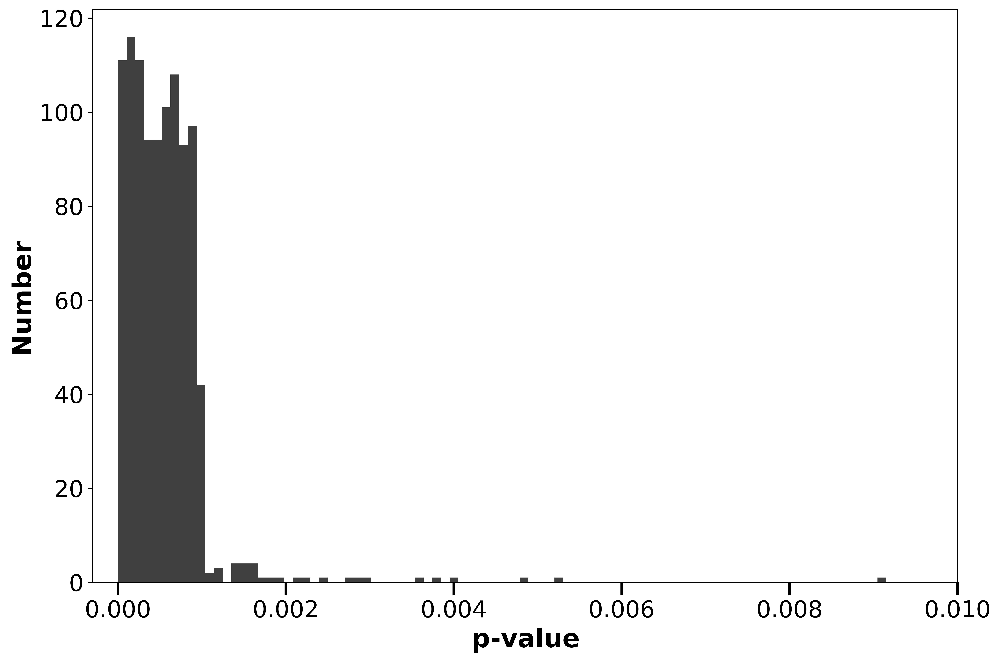

In [57]:
plt.rc('font', size=15)
plt.figure(figsize = (12, 8), dpi=800)
plt.hist(Dns_p_vals[:,1], bins='auto', color='black', alpha=0.75, density=False)
# plt.xscale('log')
plt.xlim(left=-3e-4, right=0.01)
plt.xlabel(r'$\mathbf{p}$-value', fontsize=20, weight='bold'), plt.ylabel('Number', fontsize=20, weight='bold')
plt.tick_params(axis='both', labelsize=18)
plt.tick_params(axis='x', length=10., width=2.)
plt.savefig('dda_talk_plots/p_value_ks_test_hist.png')

Converting our test statistic $D_n$ to the modified test statistic $D$ used in Puritz et al. 2023's `R` implementation to see if it matches, as $D = 2\sqrt{n_1n_2\left(n_1+n_2\right)}\,D_n$. Checking the $p$-value as well:

In [58]:
n1 = len(impactor_aeis)
n2 = len(sbdb_aeis)

puritz_D = 2 * np.sqrt(n1 * n2 * (n1 + n2)) * Dn_2_sample
puritz_D, impactor_p_val

(5917.000000000001, 0.00036738956297672847)

Test statistic matches exactly, $p$-value seems to be accurate as well (permutation test is random so will deviate from run to run)

Low $p$-value suggests we can reject the null hypothesis that the impactor and telescopic samples are drawn from the same orbital distribution; impactors are unique in some way

#### Impact probabilities:

Given an object's orbit ($a$, $e$, $i$ values), we compute the impact probability per unit time according to Opik 1951:

Use formula given by Opik and also in here: http://www.fisica.edu.uy/~gallardo/opikguara.pdf

Assuming an object with semi-major axis $a$, eccentricity $e$ and inclination $i$ and a target on a circular orbit with constant semi-major axis $a_0$, mass $m$, and radius $R$ both orbiting a star with mass $M$,  the collision probability per revolution $P$ is given by:

\begin{equation}
    P = \frac{\tau^2}{\pi\sin i}\frac{U}{\left|U_x\right|}
\end{equation}
where:
\begin{align}
    U_x &= \sqrt{2 - \frac{1}{a} - a\left(1 - e^2\right)} \nonumber \\
    U &= \sqrt{3 - \frac{1}{a} - 2\sqrt{a\left(1 - e^2\right)}\cos i} \nonumber
\end{align}
and the impactor parameter for the target, $\tau$, is given by:
\begin{equation}
    \tau = Q\sqrt{1 + \frac{2m}{MQU^2}} \nonumber
\end{equation}
where $Q = \frac{R}{a_0}$. 

We implement this as follows:

In [59]:
# constants for earth and sun
a0 = 1.  # semi-major axis of earth in au
m = 5.97e24  # mass of earth in kg
R = 4.259e-5  # radius of earth in au
M = 1.988e30  # mass of sun in kg

# get the probability P
def get_P(a, e, i, a0=a0, m=m, R=R, M=M):
    """
    Get the collision probability per revolution P for an object with semi-major axis a in AU, eccentricity e, and inclination i in degrees
    and a target on a circular orbit with constant semi-major axis a0 in AU, mass m in kg, and radius R in AU, 
    both orbiting a star with mass M in kg

    return: P, the collision probability per revolution
    """
    Q = R/a0  # Q
    Ux = np.sqrt(2 - (1/a) - (a * (1 - (e ** 2))))  # Ux
    U = np.sqrt(3 - (1/a) - ((2 * np.sqrt(a * (1 - e ** 2))) * np.cos(np.deg2rad(i))))  # U
    tau = Q * np.sqrt(1 + ((2 * m)/(M * Q * (U ** 2))))  # tau
    # tau = R * np.sqrt(1 + R/Q)
    # compute P
    P = ((tau ** 2) * U)/(np.pi * np.sin(np.deg2rad(i)) * np.abs(Ux))
    # return
    return P

Compute the collision mean time of each object, in years, from its collisional probability per revolution $P$ using a factor for the period $T \propto a^{3/2}$, for both the impactor and telescopically observed populations. Note that some of the telescopically observed objects will have `nan` values for the collisional mean time, if they never get close enough to Earth for a close encounter to be possible:

In [60]:
impactor_mean_times = np.array([(a ** (3/2))/get_P(a, e, i) for a, e, i in impactor_aeis])
sbdb_mean_times = np.array([(a ** (3/2))/get_P(a, e, i) for a, e, i in sbdb_aeis])

/tmp/ipykernel_213509/2800999452.py:17: RuntimeWarning: invalid value encountered in sqrt
  Ux = np.sqrt(2 - (1/a) - (a * (1 - (e ** 2))))  # Ux
/tmp/ipykernel_213509/2800999452.py:18: RuntimeWarning: invalid value encountered in sqrt
  U = np.sqrt(3 - (1/a) - ((2 * np.sqrt(a * (1 - e ** 2))) * np.cos(np.deg2rad(i))))  # U


Log-histogram of both distributions:

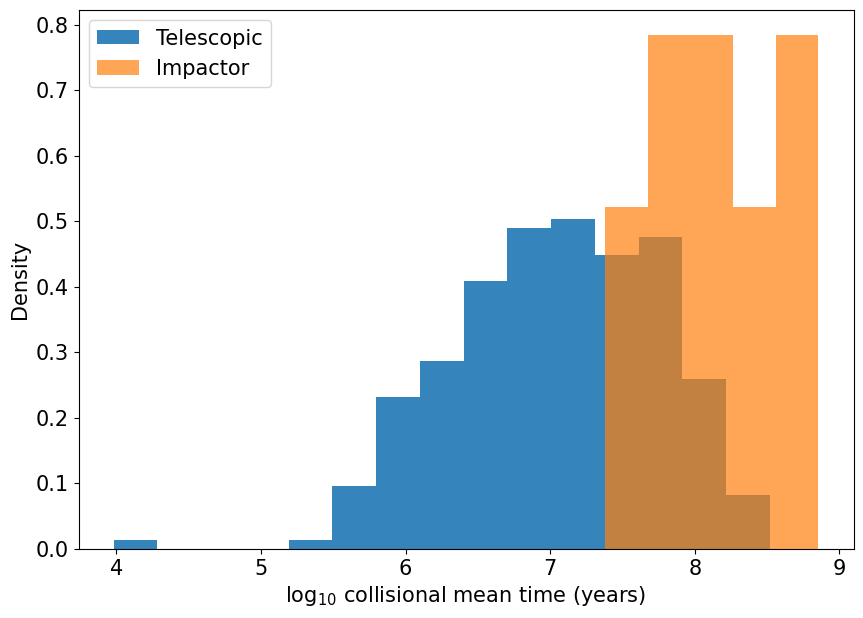

In [61]:
# convert to lgo to make more readable
plt.figure(figsize = (10, 7))
# plot histogram
plt.hist(np.log10(sbdb_mean_times), bins='auto', density=True, label = 'Telescopic', alpha=0.9)
plt.hist(np.log10(impactor_mean_times), bins='auto', density=True, label = 'Impactor', alpha=0.7)
# label axes
plt.xlabel(r'$\log_{10}\,$collisional mean time (years)'), plt.ylabel('Density')
# legend
plt.legend(loc='upper left')

Perform a $2$-sample $1$-D K-S test to see if we can reject null hypothesis (i.e. that the two samples are drawn from the same underlying distribution)

In [62]:
mean_time_ks = scipy.stats.ks_2samp(sbdb_mean_times, impactor_mean_times)
mean_time_ks.pvalue

0.0003241881107265245

Low, not quite $p < 0.05$ but quite low still; impactors seemingly have a higher collisional mean time than the telescopic population? of course this is not including the `nan` (essentially infinity) values of the telescopic population. Also $U_x$ is quite small for some of the telescopic objects, leading to small collisional mean times... is the Opik method valid in these cases?

#### Orbit similarity criterion:

Compute the Southworth \& Hawking, Jopek and Drummond orbit similarity criteria $D$ using `calcDSH`, `calcDH`, `calcDD` functions from `wmpl.utils.Dcriteria.py` file:

In [63]:
from Dcriteria import calcDSH, calcDH, calcDD

Getting all six orbital elements (note that `Dcriteria.py` parameterizes using $q$ instead of $a$) to compute the $D$ criteria for all the orbits: Pericenter is given by $q = a\left(1 - e\right)$

In [64]:
orb_param_variables

['a', 'e', 'i', 'peri', 'node', 'M']

In [65]:
sbdb_orb_elements = np.array(sbdb_dm_neos[['q', 'e', 'i', 'om', 'w']])  # pericenter, eccentricity, inclination, long. of ascending node, argument of pericenter
# compute impactor qs
impactor_qs = impactor_as * (1. - impactor_es)
# true_aeis has orbital elements in the order 'a' ,'e', 'i', 'peri', 'node', 'M' (orb_param-variables)
# so swap peri and node
impactor_orb_elements = np.concatenate((impactor_qs[:, None], true_aeis[:,[1, 2, 4, 3]]), axis=1)

Compute $D$ criteria:

Compare every impactor to every other impactor first:

In [66]:
import itertools

DSH_criteria_ii = np.array([calcDSH(*i1, *i2) for (i1, i2) in 
                            itertools.permutations(impactor_orb_elements, r=2)]).reshape((len(impactor_orb_elements), len(impactor_orb_elements) - 1))
DH_criteria_ii = np.array([calcDH(*i1, *i2) for (i1, i2) in 
                            itertools.permutations(impactor_orb_elements, r=2)]).reshape((len(impactor_orb_elements), len(impactor_orb_elements) - 1))
DD_criteria_ii = np.array([calcDD(*i1, *i2) for (i1, i2) in 
                            itertools.permutations(impactor_orb_elements, r=2)]).reshape((len(impactor_orb_elements), len(impactor_orb_elements) - 1))

Then compare every impactor to every telescopic object:

In [67]:
DSH_criteria_it = np.array([calcDSH(*impactor, *sb) for (impactor, sb) in 
                            itertools.product(impactor_orb_elements, sbdb_orb_elements)]).reshape((len(impactor_orb_elements), 
                                                                                                   len(sbdb_orb_elements)))
DH_criteria_it = np.array([calcDH(*impactor, *sb) for (impactor, sb) in 
                            itertools.product(impactor_orb_elements, sbdb_orb_elements)]).reshape((len(impactor_orb_elements), 
                                                                                                   len(sbdb_orb_elements)))
DD_criteria_it = np.array([calcDD(*impactor, *sb) for (impactor, sb) in 
                            itertools.product(impactor_orb_elements, sbdb_orb_elements)]).reshape((len(impactor_orb_elements), 
                                                                                                   len(sbdb_orb_elements)))

Do this for all the Monte Carlo samples:

Get the orbital elements for all the Monte Carlo samples:

In [68]:
mc_as, mc_es, mc_is = mc_aeis.T
mc_qs = mc_as * (1. - mc_es)
mc_orb_elements = np.concatenate((mc_qs.T[:, :, None], orb_param_array_all_events[:, :, [1, 2, 4, 3]]), axis=2)
flat_mc_orb_elements = mc_orb_elements.reshape(-1, mc_orb_elements.shape[-1])

Compute using multiprocessing, downsampling by $10$ to not crash the Python kernel with too many permutations:

In [69]:
import multiprocessing
downsampling_factor = 10  # downsample by 10 to avoid crashing python

# impactor-impactor pairs
ii_pairs = [(*i1, *i2) for (i1, i2) in itertools.permutations(flat_mc_orb_elements[::downsampling_factor], r=2)] 
# do the computation using multiprocessing
ii_pool = multiprocessing.Pool(multiprocessing.cpu_count() - 1)
DSH_criteria_ii_mc = np.array(list(tqdm(ii_pool.starmap(calcDSH, ii_pairs))))

# impactor-telescopic pairs
it_pairs = [(*impactor, *sb) for (impactor, sb) in itertools.product(flat_mc_orb_elements[::downsampling_factor], sbdb_orb_elements)]
it_pool = multiprocessing.Pool(multiprocessing.cpu_count() - 1)
DSH_criteria_it_mc = np.array(list(tqdm(it_pool.starmap(calcDSH, it_pairs))))

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 413000/413000 [00:00<00:00, 10874872.41it/s]


Computing minimum $D$ criteria for the impactors:

In [70]:
np.min(DSH_criteria_ii), DSH_criteria_ii.flatten().shape

(0.527888423547481, (182,))

In [71]:
np.min(DSH_criteria_it), len(DSH_criteria_it.flatten())

(0.22266523593041176, 4130)

And for the Monte Carlo points:

In [72]:
np.min(DSH_criteria_ii_mc), DSH_criteria_ii_mc.flatten().shape

(0.012091887611739374, (1958600,))

In [73]:
np.min(DSH_criteria_it_mc), DSH_criteria_it_mc.flatten().shape

(0.05676501416380722, (413000,))

Use the rough threshold for $D$-criteria cutoff outlined by Lindblad 1971 and Southworth and Hawkins 1963; $D_s = 0.20$ for their original sample of $360$ meteors, to identify meteors with known streams. They predict that $D_s$ varies inversely with the fourth root of sample size, so we use:

\begin{equation}
    D_s = 0.20\left(\frac{360}{N}\right)^{1/4}
\end{equation}

for a sample size of $N$, as our cutoff for the rejection level. They also use $0.15$ and $0.10$ as well

Southworth and Hawkins adopt $D_s = 0.20$ because when $D(A, B)$ was computed for all possible pairs within each of the recognized meteor showers in their survey, the value of $D(A, B)$ never exceeded $0.20$.

In [74]:
# compute thresholds for both samples
D_s_ii = np.array([0.10, 0.15, 0.20]) * ((360./len(DSH_criteria_ii.flatten())) ** (1/4))
D_s_it = np.array([0.10, 0.15, 0.20]) * ((360./len(DSH_criteria_it.flatten())) ** (1/4))

D_s_ii, D_s_it

(array([0.11859265, 0.17788898, 0.2371853 ]),
 array([0.05433606, 0.08150408, 0.10867211]))

And for the Monte Carlo samples:

In [75]:
# compute thresholds for both samples
D_s_ii_mc = np.array([0.10, 0.15, 0.20]) * ((360./len(DSH_criteria_ii_mc.flatten())) ** (1/4))
D_s_it_mc = np.array([0.10, 0.15, 0.20]) * ((360./len(DSH_criteria_it_mc.flatten())) ** (1/4))

D_s_ii_mc, D_s_it_mc

(array([0.01164365, 0.01746548, 0.0232873 ]),
 array([0.01718257, 0.02577385, 0.03436514]))

Plotting CDF of impactor-impactor and impactor-telescopic $D$ criteria with the thresholds marked:

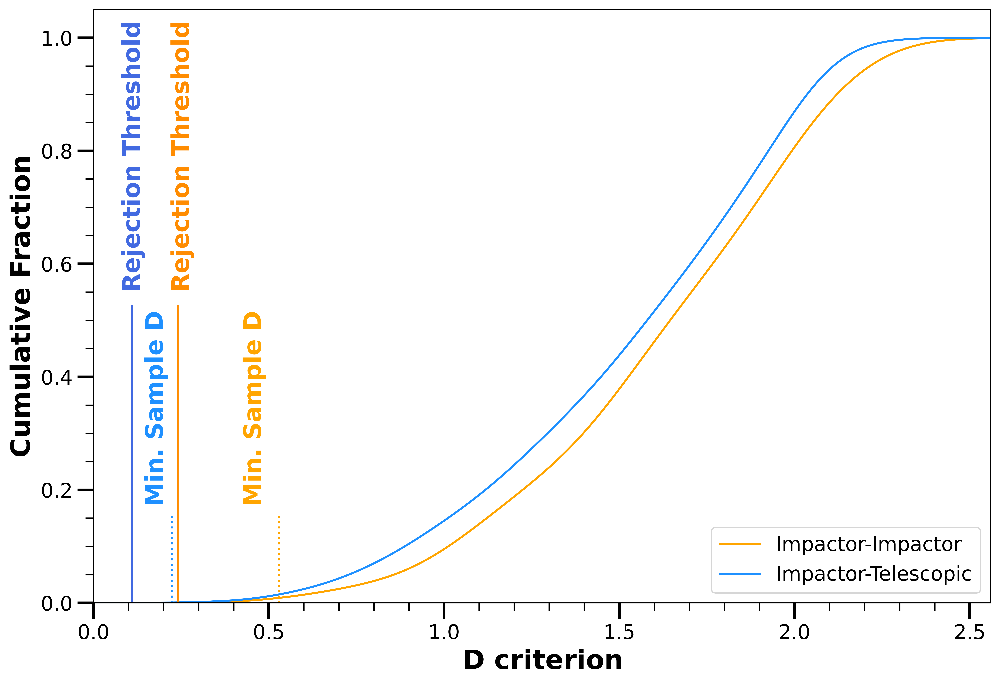

In [76]:
plt.figure(figsize = (12, 8), dpi=800)
sns.kdeplot(data=DSH_criteria_ii.flatten(), cumulative=True, c='orange', label = 'Impactor-Impactor')
sns.kdeplot(data=DSH_criteria_it.flatten(), cumulative=True, c='dodgerblue', label = 'Impactor-Telescopic')
plt.xlabel(r'$\mathbf{D}$ criterion', fontsize=20, weight='bold'), plt.ylabel('Cumulative Fraction', fontsize=20, weight='bold')
# x limit
# plt.xlim(left=np.min(DSH_criteria_it.flatten()))
plt.xlim(left=0., right=np.max(DSH_criteria_it) + 0.2)
# vertical lines threshold
# plt.axvline(x=np.round(D_s_ii[-1], 2), ymin=0.72, c='darkorange')
plt.axvline(x=np.round(D_s_ii[-1], 2), ymax=0.50, c='darkorange')
# plt.axvline(x=np.round(D_s_it[-1], 2), ymin=0.72, c='darkblue')
plt.axvline(x=np.round(D_s_it[-1], 2), ymax=0.50, c='royalblue')
# shorter lines observed
# plt.axvline(x=np.min(DSH_criteria_ii), ymin=0.37, c='orange', linestyle='dotted')
plt.axvline(x=np.min(DSH_criteria_ii), ymax=0.15, c='orange', linestyle='dotted')
# plt.axvline(x=np.min(DSH_criteria_it), ymin=0.37, c='dodgerblue', linestyle='dotted')
plt.axvline(x=np.min(DSH_criteria_it), ymax=0.15, c='dodgerblue', linestyle='dotted')
# vertical lines threshold
# plt.annotate(rf'${np.round(D_s_ii[-1], 2)}$', xy=(0.22, 0.66), xycoords='data', rotation=90, fontsize=16, color='darkorange')
# plt.annotate(rf'${np.round(D_s_it[-1], 2)}$', xy=(0.08, 0.66), xycoords='data', rotation=90, fontsize=16, color='darkblue')
plt.annotate('Rejection Threshold', xy=(0.22, 0.56), xycoords='data', rotation=90, fontsize=18, color='darkorange', weight='bold')
plt.annotate('Rejection Threshold', xy=(0.08, 0.56), xycoords='data', rotation=90, fontsize=18, color='royalblue', weight='bold')
# shorter lines observed
# plt.annotate(rf'${np.round(np.min(DSH_criteria_ii), 2)}$', xy=(0.425, 0.285), xycoords='data', rotation=90, fontsize=16, color='orange')
# plt.annotate(rf'${np.round(np.min(DSH_criteria_it), 2)}$', xy=(0.145, 0.285), xycoords='data', rotation=90, fontsize=16, color='dodgerblue')
plt.annotate(r'Min. Sample $\mathbf{D}$', xy=(0.425, 0.18), xycoords='data', rotation=90, fontsize=18, color='orange', weight='bold')
plt.annotate(r'Min. Sample $\mathbf{D}$', xy=(0.145, 0.18), xycoords='data', rotation=90, fontsize=18, color='dodgerblue', weight='bold')
# tick params
plt.minorticks_on()
plt.tick_params('both', length=12, width=2., which='major')
plt.tick_params('both', length=6, width=1., which='minor')
# legend
plt.legend(markerscale=20, loc='lower right')
# tight layout
# plt.tight_layout()
# save
plt.savefig('dda_talk_plots/impactor_telescopic_cdfs.png')

Generate LaTeX table with UTC Date, $a$, $e$, $i$, $q$, $\omega$, $\Omega$, $T_j$:

In [77]:
# generate latex table from true aeis
true_aeis_df = pd.concat([impactor_state_vectors.Time, pd.DataFrame(true_aeis)], axis=1)
# compute and add tisserand parameter
true_aeis_df.columns = np.concatenate((['UTC Date'], orb_param_variables))
sma_jupiter = 5.20336301
true_aeis_df[r'$T_j$'] = (sma_jupiter/true_aeis_df.a) + 2 * np.cos(np.deg2rad(true_aeis_df.i)) * np.sqrt((true_aeis_df.a/sma_jupiter) * (1 - true_aeis_df.e ** 2))
# compute and add q
true_aeis_df.insert(loc=4, column='q', value=true_aeis_df.a * (1. - true_aeis_df.e))
true_aeis_df = true_aeis_df.drop(columns=['M'])
# rename again
true_aeis_df.columns = ['UTC Date', r'$a$', r'$e$', r'$i$', r'$q$', r'$\omega$', r'$\Omega$', r'$T_j$']
true_aeis_df = true_aeis_df.sort_values(by=['UTC Date'])
true_aeis_df.reset_index(drop=True, inplace=True)
# true_aeis_df = np.round(true_aeis_df, 2)
true_aeis_df['UTC Date'] = pd.to_datetime(true_aeis_df['UTC Date'], format='mixed', dayfirst=False).dt.strftime('%Y-%m-%d')
true_aeis_df = true_aeis_df.style.format(decimal='.', precision=2)
true_aeis_df.to_latex()
true_aeis_df

,UTC Date,$a$,$e$,$i$,$q$,$\omega$,$\Omega$,$T_j$
0,1994-02-01,2.14,0.72,2.10,0.60,273.34,132.89,3.32
1,1999-01-14,1.90,0.48,14.50,0.98,352.80,113.71,3.76
2,2004-09-03,0.82,0.23,11.63,0.63,191.97,341.25,7.08
3,2004-10-07,2.56,0.67,10.20,0.84,307.16,14.55,3.06
4,2006-12-09,2.63,0.64,1.73,0.94,150.77,256.95,3.07
5,2009-10-08,1.18,0.55,14.18,0.54,71.97,194.83,5.18
6,2010-07-06,2.54,0.62,2.01,0.96,328.30,284.56,3.14
7,2010-12-25,1.00,0.39,16.45,0.61,69.15,273.91,5.98
8,2013-02-15,1.71,0.56,4.12,0.75,109.50,326.44,4.00
9,2013-04-30,1.07,0.12,7.19,0.94,247.51,40.01,5.77


In [79]:
true_aeis_df

,UTC Date,a,e,i,peri,node,M
0,20130215-032000.000000,1.707077,0.559619,4.115442,109.496776,326.444720,20.053869
1,20181218-234800.000000,1.567088,0.398035,38.343358,211.217144,266.752115,347.313664
2,20101225-232400.000000,0.999096,0.390349,16.452354,69.149984,273.913886,65.358605
3,20091008-025700.000000,1.181766,0.545111,14.181182,71.970378,194.833422,43.585297
4,19940201-223809.000000,2.135537,0.720735,2.101090,273.335529,132.889000,14.206339
5,20130430-084000.000000,1.067342,0.117548,7.187758,247.513264,40.005455,304.481159
6,20100706-235400.000000,2.542362,0.623112,2.007251,328.302943,284.561561,6.008867
7,20061209-063100.000000,2.625408,0.643544,1.727624,150.774337,256.954883,5.019877
8,20040903-120722.000000,0.823644,0.232537,11.632231,191.970353,341.252981,161.401257
9,20160206-135500.000000,0.617525,0.599744,3.856576,2.797167,316.973180,171.101343


In [82]:
true_aeis_df = pd.concat([impactor_state_vectors.Time, pd.DataFrame(true_aeis)], axis=1)
# compute and add tisserand parameter
true_aeis_df.columns = np.concatenate((['UTC Date'], orb_param_variables))
true_aeis_df = true_aeis_df.sort_values(by=['UTC Date'])
np.round(true_aeis_df.a * (1. + true_aeis_df.e), 2)

4     3.67
12    2.82
8     1.02
11    4.27
7     4.31
3     1.83
6     4.13
2     1.39
0     2.66
5     1.19
9     0.99
1     2.19
10    3.22
13    1.50
dtype: float64

### Testing/Debugging:

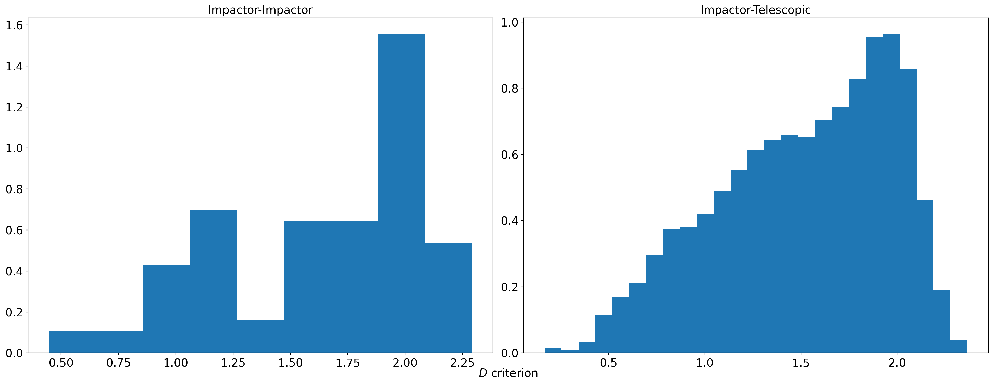

In [71]:
fig = plt.figure(figsize = (20, 8), dpi=200)
# add big subplot and turn off axes
ax_big1 = fig.add_subplot(111)
ax_big1.spines['top'].set_color('none')
ax_big1.spines['bottom'].set_color('none')
ax_big1.spines['left'].set_color('none')
ax_big1.spines['right'].set_color('none')
ax_big1.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)
# make d criterion histograms
ax0 = fig.add_subplot(121)
ax1 = fig.add_subplot(122)
# plot
ax0.hist(DSH_criteria_ii.flatten(), bins='auto', density=True)  # impactor/impactor
ax1.hist(DSH_criteria_it.flatten(), bins='auto', density=True)  # impactor/telescopic
# common x axis
ax_big1.set_xlabel(r'$D$ criterion', fontsize=16)
# each plot
ax0.set_title('Impactor-Impactor', fontsize=16)
ax1.set_title('Impactor-Telescopic', fontsize=16)
# axis ticks
ax0.tick_params(axis='both', which='major', labelsize=16)
ax1.tick_params(axis='both', which='major', labelsize=16)
ax0.tick_params(axis='both', which='minor', labelsize=12)
ax1.tick_params(axis='both', which='minor', labelsize=12)
# tight layout
plt.tight_layout()
# save
plt.savefig('dda_talk_plots/d_criterion_histogram.png')

#### K-S test stuff:

In [ ]:
l_qppp, l_qppn, l_qpnp, l_qpnn, l_qnpp, l_qnpn, l_qnnp, l_qnnn, f_qppp, f_qppn, f_qpnp, f_qpnn, f_qnpp, f_qnpn, f_qnnp, f_qnnn

In [ ]:
qppp

In [ ]:
# constants for earth and sun
a0 = 1.  # semi-major axis of earth in au
m = 5.97e24  # mass of earth in kg
R = 4.259e-5  # radius of earth in au
M = 1.988e30  # mass of sun in kg

# get the probability P
def get_P(a, e, i, a0=a0, m=m, R=R, M=M):
    """
    Get the collision probability per revolution P for an object with semi-major axis a in AU, eccentricity e, and inclination i in degrees
    and a target on a circular orbit with constant semi-major axis a0 in AU, mass m in kg, and radius R in AU, 
    both orbiting a star with mass M in kg

    return: P, the collision probability per revolution
    """
    Q = R/a0  # Q
    Ux = np.sqrt(2 - (1/a) - (a * (1 - (e ** 2))))  # Ux
    U = np.sqrt(3 - (1/a) - ((2 * np.sqrt(a * (1 - e ** 2))) * np.cos(np.deg2rad(i))))  # U
    tau = Q * np.sqrt(1 + ((2 * m)/(M * Q * (U ** 2))))  # tau
    # tau = R * np.sqrt(1 + R/Q)
    # compute P
    P = ((tau ** 2) * U)/(np.pi * np.sin(np.deg2rad(i)) * np.abs(Ux))
    # return
    return P

In [ ]:
# number of impactors is n1, number of telescopic objects is n2
n1 = len(impactor_aeis)
n2 = len(sbdb_aeis)

# Dn1 and 2 are the maximum values across all samples from 1...n1 and 1...n2 
Dn1_arr = np.zeros(n1)  
Dn2_arr = np.zeros(n2)

# run this for all points in the impactor aeis to compute the probability of finding points in each of the 8
# volumes of 3-D space for the samples using the actual data, by counting the fractino of points in each volume

# impactors
for i, point1 in tqdm(enumerate(impactor_aeis)):
    a1, e1, i1 = point1
    # computes the probabilities of finding points in each of the 8 volumes of 3-D space for the first
    # set of samples (impactors) using the actual data, by counting the fraction of points in each volume
    
    fppp11 = len(impactor_aeis[(impactor_as > a1) & (impactor_es > e1) & (impactor_is > i1)])
    fppn11 = len(impactor_aeis[(impactor_as > a1) & (impactor_es > e1) & (impactor_is < i1)])
    fpnp11 = len(impactor_aeis[(impactor_as > a1) & (impactor_es < e1) & (impactor_is > i1)])
    fpnn11 = len(impactor_aeis[(impactor_as > a1) & (impactor_es < e1) & (impactor_is < i1)])
    
    fnpp11 = len(impactor_aeis[(impactor_as < a1) & (impactor_es > e1) & (impactor_is > i1)])
    fnpn11 = len(impactor_aeis[(impactor_as < a1) & (impactor_es > e1) & (impactor_is < i1)])
    fnnp11 = len(impactor_aeis[(impactor_as < a1) & (impactor_es < e1) & (impactor_is > i1)])
    fnnn11 = len(impactor_aeis[(impactor_as < a1) & (impactor_es < e1) & (impactor_is < i1)])

    # and for the second set of samples (telescopic)

    fppp21 = len(sbdb_aeis[(sbdb_as > a1) & (sbdb_es > e1) & (sbdb_is > i1)])
    fppn21 = len(sbdb_aeis[(sbdb_as > a1) & (sbdb_es > e1) & (sbdb_is < i1)])
    fpnp21 = len(sbdb_aeis[(sbdb_as > a1) & (sbdb_es < e1) & (sbdb_is > i1)])
    fpnn21 = len(sbdb_aeis[(sbdb_as > a1) & (sbdb_es < e1) & (sbdb_is < i1)])
    
    fnpp21 = len(sbdb_aeis[(sbdb_as < a1) & (sbdb_es > e1) & (sbdb_is > i1)])
    fnpn21 = len(sbdb_aeis[(sbdb_as < a1) & (sbdb_es > e1) & (sbdb_is < i1)])
    fnnp21 = len(sbdb_aeis[(sbdb_as < a1) & (sbdb_es < e1) & (sbdb_is > i1)])
    fnnn21 = len(sbdb_aeis[(sbdb_as < a1) & (sbdb_es < e1) & (sbdb_is < i1)])
    
    # sum of f_vols when dividing each of them by n1 or n2 should be close to 1 but it isn't... 
    # could be because there are relatively few impactors in the second sample
    f_vols11 = np.array([fppp11, fppn11, fpnp11, fppn11, fnpp11, fnpn11, fnnp11, fnnn11])
    f_vols21 = np.array([fppp21, fppn21, fpnp21, fppn21, fnpp21, fnpn21, fnnp21, fnnn21])

    # so, we normalize them to 1
    # normalized_f_vols11 = f_vols11/np.sum(f_vols11)
    normalized_f_vols11 = f_vols11/n1  # this doesn't normalize to 1 exactly! but it's what Puritz et al. 2023 use?
    # normalized_f_vols21 = f_vols21/np.sum(f_vols21)
    normalized_f_vols21 = f_vols21/n2

    # now compute the absolute maximum difference Dn between the KDE distribution and the sample, across all 8
    # 8 volumes of 3-D space 
    Dn1_arr[i] = np.max(np.array([np.abs(f1-f2) for f1, f2 in zip(normalized_f_vols11, normalized_f_vols21)]))
    
    # Dn1 = np.max((Dn1, np.max(np.array([np.abs(f1-f2) for f1, f2 in zip(normalized_f_vols11, normalized_f_vols21)]))))

# telescopic
for j, point2 in tqdm(enumerate(sbdb_aeis)):
    a2, e2, i2 = point2
    # computes the probabilities of finding points in each of the 8 volumes of 3-D space for the second
    # set of samples (telescopic) using the actual data, by counting the fraction of points in each volume
    
    fppp12 = len(impactor_aeis[(impactor_as > a2) & (impactor_es > e2) & (impactor_is > i2)])
    fppn12 = len(impactor_aeis[(impactor_as > a2) & (impactor_es > e2) & (impactor_is < i2)])
    fpnp12 = len(impactor_aeis[(impactor_as > a2) & (impactor_es < e2) & (impactor_is > i2)])
    fpnn12 = len(impactor_aeis[(impactor_as > a2) & (impactor_es < e2) & (impactor_is < i2)])
    
    fnpp12 = len(impactor_aeis[(impactor_as < a2) & (impactor_es > e2) & (impactor_is > i2)])
    fnpn12 = len(impactor_aeis[(impactor_as < a2) & (impactor_es > e2) & (impactor_is < i2)])
    fnnp12 = len(impactor_aeis[(impactor_as < a2) & (impactor_es < e2) & (impactor_is > i2)])
    fnnn12 = len(impactor_aeis[(impactor_as < a2) & (impactor_es < e2) & (impactor_is < i2)])

    # and for the second set of samples (telescopic)

    fppp22 = len(sbdb_aeis[(sbdb_as > a2) & (sbdb_es > e2) & (sbdb_is > i2)])
    fppn22 = len(sbdb_aeis[(sbdb_as > a2) & (sbdb_es > e2) & (sbdb_is < i2)])
    fpnp22 = len(sbdb_aeis[(sbdb_as > a2) & (sbdb_es < e2) & (sbdb_is > i2)])
    fpnn22 = len(sbdb_aeis[(sbdb_as > a2) & (sbdb_es < e2) & (sbdb_is < i2)])
    
    fnpp22 = len(sbdb_aeis[(sbdb_as < a2) & (sbdb_es > e2) & (sbdb_is > i2)])
    fnpn22 = len(sbdb_aeis[(sbdb_as < a2) & (sbdb_es > e2) & (sbdb_is < i2)])
    fnnp22 = len(sbdb_aeis[(sbdb_as < a2) & (sbdb_es < e2) & (sbdb_is > i2)])
    fnnn22 = len(sbdb_aeis[(sbdb_as < a2) & (sbdb_es < e2) & (sbdb_is < i2)])
    
    # sum of f_vols when dividing each of them by n1 or n2 should be close to 1 but it isn't... 
    # could be because there are relatively few impactors in the second sample
    f_vols12 = np.array([fppp12, fppn12, fpnp12, fppn12, fnpp12, fnpn12, fnnp12, fnnn12])
    f_vols22 = np.array([fppp22, fppn22, fpnp22, fppn22, fnpp22, fnpn22, fnnp22, fnnn22])

    # so, we normalize them to 1
    # normalized_f_vols12 = f_vols12/np.sum(f_vols12)
    normalized_f_vols12 = f_vols12/n1  # this doesn't normalize to 1 exactly! but it's what Puritz et al. 2023 use?
    # normalized_f_vols22 = f_vols22/np.sum(f_vols22)
    normalized_f_vols22 = f_vols22/n2
    
    # print(np.sum(l_vols), np.sum(f_vols))
    # now compute the absolute maximum difference Dn between the KDE distribution and the sample, across all 8
    # 8 volumes of 3-D space 
    Dn2_arr[j] = np.max(np.array([np.abs(f1-f2) for f1, f2 in zip(normalized_f_vols12, normalized_f_vols22)]))
    # Dn2 = np.max((Dn2, np.max(np.array([np.abs(f1-f2) for f1, f2 in zip(normalized_f_vols12, normalized_f_vols22)]))))

# compute Dn1, Dn2 test statistic as the maximum value of Dn across 1...n1 and 1...n2 samples respectively
Dn1 = np.max(Dn1_arr)
Dn2 = np.max(Dn2_arr)

Take $D_n = \frac{D_{n_1} + D_{n_2}}{2}$ in this case (average of the $D_n$ values of the data cumulated by both the impactor and telescopic samples) and $n = \frac{n_1\,n_2}{\left(n_1 + n_2\right)}$ and compute the $Z_n$-statistic and subsequent $p$-value in the same way, again according to Peacock 1983 and Fasano/Franceschini 1987:

In [ ]:
# take Dn according to Peacock 1983 and Fasano/Francheschini 1987:
Dn_2_sample = np.mean((Dn1, Dn2))
# take n according to Peacock 1983 and Fasano/Francheschini 1987:
n_2_sample = (n1 * n2)/(n1 + n2)
# Set Z_n = sqrt(n) * Dn 
Zn_2_sample = np.sqrt(n_2_sample) * Dn_2_sample
Dn_2_sample, Zn_2_sample

In [ ]:
# aei_grid.reshape(npoints, npoints, npoints, 3), likelihoods.reshape(npoints, npoints, npoints)

In [ ]:
aei_grid[1000], np.exp(kde_aei.score_samples(aei_grid[1000].reshape(1, -1)))

In [ ]:
likelihoods.reshape(npoints, npoints, npoints)[0, 10, 0]

In [ ]:
aei_grid.reshape(npoints, npoints, npoints, 3)[0, 10, 0]

In [ ]:
p = [-2, 1, 2]  # point

p[0]

In [ ]:
sbdb_aeis[0].shape

#### KDE stuff:

Try drawing a KDE:

In [ ]:
def kde2D(x, y, bandwidth, xbins=100j, ybins=100j, **kwargs): 
    """Build 2D kernel density estimate (KDE)."""

    # create grid of sample locations (default: 100x100)
    xx, yy = np.mgrid[x.min():x.max():xbins, 
                      y.min():y.max():ybins]

    xy_sample = np.vstack([yy.ravel(), xx.ravel()]).T
    xy_train  = np.vstack([y, x]).T

    kde_skl = KernelDensity(bandwidth=bandwidth, **kwargs)
    kde_skl.fit(xy_train)

    # score_samples() returns the log-likelihood of the samples
    z = np.exp(kde_skl.score_samples(xy_sample))
    return xx, yy, np.reshape(z, xx.shape)
    

In [ ]:
m1 = np.random.normal(size=1000)
m2 = np.random.normal(scale=0.5, size=1000)

x, y = m1 + m2, m1 - m2

xx, yy = np.mgrid[x.min():x.max():100j, 
                  y.min():y.max():100j]

xy_sample = np.vstack([yy.ravel(), xx.ravel()]).T
xy_train  = np.vstack([y, x]).T

xy_train

In [ ]:
kde_model_dv = KernelDensity(bandwidth=dv_bandwidth, kernel=kernel_type)

In [ ]:
kde_granvik = KernelDensity(bandwidth=1., kernel='gaussian').fit(np.array(granvik_aeihs))

In [ ]:
kde_granvik

In [ ]:
granvik_aeihs

In [ ]:
for i, event in enumerate(aeihs):
    pool = multiprocessing.Pool(multiprocessing.cpu_count() - 1)  # avoids locking up the CPU by using every core
    
rb_param_array_single_event = np.asarray(list(tqdm(pool.imap(get_orbital_parameters, state_vector_par_list))))

Stepsize in:

- SMA: 0.1
- Ecc: 0.04
- Inc: 4
- H: 0.25
  

In [ ]:
def lerp_4d():
    """
    Basic 4d lerp function only taking into account the adjacent two points
    """
    

In [ ]:
# index of smallest element of smas greater than 2, this is the index of the interpolation upper bound
interp_ub_sma_ind = np.where(smas == smas[smas >= 2.002317].min())
# index of largest element of smas less than 2, this is the index of the interpolation lower bound
interp_lb_sma_ind = np.where(smas == smas[smas <= 2.002317].max())

In [ ]:
# index of smallest element of smas greater than 2, this is the index of the interpolation upper bound
interp_ub_ecc_ind = np.where(eccs == eccs[eccs >= 0.636153].min())
# index of largest element of smas less than 2, this is the index of the interpolation lower bound
interp_lb_ecc_ind = np.where(eccs == eccs[eccs <= 0.636153].max())

In [ ]:
# index of smallest element of smas greater than 2, this is the index of the interpolation upper bound
interp_ub_inc_ind = np.where(incs == incs[incs >= 5.553677].min())
# index of largest element of smas less than 2, this is the index of the interpolation lower bound
interp_lb_inc_ind = np.where(incs == incs[incs <= 5.553677].max())

In [ ]:
# index of smallest element of smas greater than 2, this is the index of the interpolation upper bound
interp_ub_H_ind = np.where(Hs == Hs[Hs >= 20.].min())
# index of largest element of smas less than 2, this is the index of the interpolation lower bound
interp_lb_H_ind = np.where(Hs == Hs[Hs <= 20.].max())

In [ ]:
from functools import reduce

common_index_ub = reduce(np.intersect1d, (interp_ub_sma_ind, interp_ub_ecc_ind, interp_ub_inc_ind, interp_ub_H_ind))
common_index_lb = reduce(np.intersect1d, (interp_lb_sma_ind, interp_lb_ecc_ind, interp_lb_inc_ind, interp_lb_H_ind))

In [ ]:
granvik_model.iloc[common_index_ub]

In [ ]:
granvik_model.iloc[common_index_lb]

In [ ]:
def add_epsilon(arr, eps=1e-12):
    """
    Helper function to add epsilons to an array with many repeating values to make them all unique, so that array can be used
    in interpolation
    """
    new_arr = []

    for elem in np.unique(arr):
        # print(elem)
        new_arr.append(list(np.add(arr[arr == elem], np.linspace(0., len(arr[arr == elem]) * eps, len(arr[arr == elem])))))

    return np.array([item for ls in new_arr for item in ls])

In [ ]:
new_smas = add_epsilon(smas)
new_eccs = add_epsilon(eccs)
new_incs = add_epsilon(incs)
new_Hs = add_epsilon(Hs)

In [ ]:
xtest_old = np.array(granvik_model[['sma', 'ecc', 'inc', 'Hmag']])
xtest_new = np.array((new_smas, new_eccs, new_incs, new_Hs)).T

In [ ]:
scipy.interpolate.RBFInterpolator(xtest_new, np.array(granvik_model['nu6_prob']), neighbors=1e4, kernel='linear')(np.array([[2.002317, 0.636153, 5.553677, 20.]]))

In [ ]:
scipy.interpolate.RegularGridInterpolator((new_smas, new_eccs, new_incs, new_Hs), np.array(granvik_model['nu6_prob']))

In [ ]:
len(np.unique(smas)), len(np.unique(eccs)), len(np.unique(incs)), len(np.unique(Hs))

In [ ]:
np.min(smas), np.max(smas)

In [ ]:
np.arange(np.min(smas), np.max(smas) + 0.1, 0.1)

In [ ]:
len(granvik_model['nu6_prob'])

In [ ]:
xtest_new.shape, np.array(granvik_model['nu6_prob']).shape

In [ ]:
np.array([
        [ 27.827,  18.53 , -30.417], [ 24.002,  17.759, -24.782],
        [ 22.145,  13.687, -33.282], [ 17.627,  18.224, -25.197],
        [ 29.018,  18.841, -38.761], [ 24.834,  20.538, -33.012],
        [ 26.232,  22.327, -27.735], [ 23.017,  23.037, -29.23 ],
        [ 28.761,  21.565, -31.586], [ 26.263,  23.686, -32.766]]).shape

In [ ]:
np.array([0.205,  0.197,  0.204,  0.197,  0.212,  
                   0.208,  0.204,  0.205, 0.211,  0.215]).shape

In [ ]:
def f(x, y, z):

    return 2 * x**3 + 3 * y**2 - z
x = np.linspace(1, 4, 11)
y = np.linspace(4, 7, 22)
z = np.linspace(7, 9, 33)
xg, yg ,zg = np.meshgrid(x, y, z, indexing='ij', sparse=True)
data = f(xg, yg, zg)

In [ ]:
x.shape, y.shape, z.shape, data.shape

In [ ]:
np.array(granvik_model['nu6_prob']).shape

In [ ]:
new_smas.shape

In [ ]:
(np.array([[2.002317, 0.636153, 5.553677, 20.]]))

In [ ]:
eccs[eccs == 0.34].shape

In [ ]:
np.arange(0., len(eccs[eccs == 0.34])*eps, eps).shape

In [ ]:
len(eccs[eccs == 0.34])*eps

In [ ]:
np.add(eccs[eccs == 0.34], np.linspace(0., len(eccs[eccs == 0.34])*eps, len(eccs[eccs == 0.34])))

In [ ]:
new_eccs = []

for ecc in np.unique(eccs):
    new_eccs.append(list(np.add(eccs[eccs == ecc], np.arange(0., len(eccs[eccs == ecc])*eps, eps))))

new_eccs = np.array([item for ls in new_eccs for item in ls])

In [ ]:
smas, new_smas

In [ ]:
ytest = np.array(granvik_model[['nu6_prob', '5/2_prob', '2/1_prob', 'HUN_prob', '3/1_prob', 'PHO_prob', 'JFC_prob', 
                   'nu6_sigma', '5/2_sigma', '2/1_sigma', 'HUN_sigma']], dtype=np.float64)

In [ ]:
interp_ub_sma_ind, interp_lb_sma_ind

In [ ]:
interp_ub_ecc_ind, interp_lb_ecc_ind

In [ ]:
interp_ub_inc_ind, interp_lb_inc_ind

In [ ]:
orb_param_array_all_events[0, 1]

In [ ]:
granvik_model

Debugging for individual state vector-to-orbital element computations:

In [ ]:
state_vector_index = 0

dv, v, t, a, o, e, azim, zen = state_vector_par_list[state_vector_index]
alt = 90 - zen

output = subprocess.run(['python3', '-m', 'wmpl.Trajectory.Orbit', '-v', f'{v + dv}', '-t', f'{t}', '-a', f'{a}', '-o', f'{o}', '-e', f'{e}', 
            '--azim', f'{azim}', '--alt', f'{alt}', '--vrotcorr', '--statfixed'], capture_output=True)
# [elem for elem in list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) if elem.startswith(tuple(orb_param_variables))]

In [ ]:
test = np.array([np.float64(string) for param in [elem for elem in list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) 
                                           if elem.startswith(tuple(orb_param_variables))] 
          for string in param.split() if string.lstrip('-').replace('.', '').isdigit() or string =='nan'])

In [ ]:
if not test.size:
    test = np.repeat('EMPTY', len(orb_param_variables))

In [ ]:
test

In [ ]:
state_vector_par_list[0]

In [ ]:
90 - 50.49624884

In [ ]:
12.08304597 -2.5400464418708926

In [ ]:
pooltest = multiprocessing.Pool(multiprocessing.cpu_count() - 1)  # avoids locking up the CPU by using every core
orb_param_list = list(tqdm(pooltest.imap(get_orbital_parameters, state_vector_par_list)))

In [ ]:
np.array(orb_param_list)

Test if the multiprocessing is working

In [ ]:
# def get_orbital_parameters(state_vector_params, orb_param_variables=['a', 'e', 'i', 'peri', 'node', 'M']):
#     """
#     Gets the orbital parameter values corresponding to each parameter in orb_param_variables from the state vector state_vector

#     param state_vector_params: tuple of (dv, v, t, a, o, e, azim, alt):
#     dv is the velocity uncertainty to be added to the velocity vector
#     v is the velocity
#     t is the time of the event
#     a is the latitude
#     o is the longitude
#     e is the elevation of the event
#     azim is the radiant azimuth
#     zen is the zenith distance (90 minus the altitude angle)

#     returns a 1-D array of parameter values corresponding to the parameters in orb_param_variables, in the same order
#     """
#     dv, v, t, a, o, e, azim, zen = state_vector_params  # get the state vector parameters
#     # converting from zenith angle to altitude angle
#     alt = 90 - zen
#     # get the output from the wmpl.Trajectory.Orbit file, adding the uncertainty in velocity to the velocity vector of the event
#     output = subprocess.run(['python3', '-m', 'wmpl.Trajectory.Orbit', '-v', f'{v + dv}', '-t', f'{t}', '-a', f'{a}', '-o', f'{o}', '-e', f'{e}', 
#             '--azim', f'{azim}', '--alt', f'{alt}', '--vrotcorr', '--statfixed'], capture_output=True)
#     # get the orbital parameters in the order of orb_param_variables
    
#     # orb_param_list = [elem for elem in list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) 
#     #               if elem.startswith(tuple(orb_param_variables))]
#     # orb_param_array = [np.float64(string) for param in orb_param_list for string in param.split() if string.replace('.', '').isdigit()]
    
#     orb_param_array = np.array([np.float64(string) for param in [elem for elem in 
#                                                              list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) 
#                                                              if elem.startswith(tuple(orb_param_variables))] 
#                             for string in param.split() if string.lstrip('-').replace('.', '').isdigit() or string =='nan'])
#     # return the orbital parameter array
#     return orb_param_array

In [ ]:
# chelyabinsk params

v = 18.61424186
t = "20130215-032033.0"
a = 54.8
o = 61.1
e = 23.3
azim = 99.8959271
zen = 74.07574403

from tqdm import tqdm
import subprocess

# list of orbital parameters we want to get (named the same as in the wmpl output, in that order
orb_param_variables = ['a', 'e', 'i', 'peri', 'node', 'M']  
# monte carlo
n_monte_carlo_samples = 100
dv_samples = kde_model_dv.sample(n_samples=n_monte_carlo_samples).flatten()

# create parameter list for multiprocessing
state_vector_par_list = []
# use different dv for each set of parameters
for dv in dv_samples:
    state_vector_params = (dv, v, t, a, o, e, azim, zen)
    state_vector_par_list.append(state_vector_params)

In [ ]:
import multiprocessing

pool = multiprocessing.Pool(multiprocessing.cpu_count() - 1)  # avoids locking up the CPU by using every core
orb_param_array = list(tqdm(pool.imap(get_orbital_parameters, state_vector_par_list)))

Distribution of semi-major axis for all the Monte Carlo clones compared to the true value for chelyabinsk

In [ ]:
plt.figure(figsize = (12, 8))
# plot distribution of semi-major axis for all the Monte Carlo clones compard to "true" value for chelyabinsk
plt.hist(np.array(orb_param_array)[:,0], bins='fd')
plt.axvline(1.713518, c='r')

Getting orbital parameters from state vectors test:

In [ ]:
chelyabinsk = impactor_state_vectors.iloc[0]

# chelyabinsk params

v = 18.61424186
t = "20130215-032033.0"
a = 54.8
o = 61.1
e = 23.3
azim = 99.8959271
alt = 15.924256

from tqdm import tqdm
import subprocess

# list of orbital parameters we want to get (named the same as in the wmpl output, in that order
orb_param_variables = ['a', 'e', 'i', 'peri', 'node', 'M']  
# initialize empty array to hold all the orbital parameters
orb_param_array = np.zeros((n_monte_carlo_samples, len(orb_param_variables)))

# convert the monte carlo'd state vectors to orbital parameters
for i, dv in tqdm(enumerate(dv_samples)):
    # get the output from the wmpl.Trajectory.Orbit file, adding the uncertainty in speed to the velocity vector of the event
    output = subprocess.run(['python3', '-m', 'wmpl.Trajectory.Orbit', '-v', f'{v + dv}', '-t', f'{t}', '-a', f'{a}', '-o', f'{o}', '-e', f'{e}', 
                '--azim', f'{azim}', '--alt', f'{alt}', '--vrotcorr', '--statfixed'], capture_output=True)
    # get the orbital parameters in the order of orb_param_variables
    
    # orb_param_list = [elem for elem in list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) 
    #               if elem.startswith(tuple(orb_param_variables))]
    # orb_param_array[i] = [np.float64(string) for param in orb_param_list for string in param.split() if string.replace('.', '').isdigit()]
    
    orb_param_array[i] = np.array([np.float64(string) for param in [elem for elem in 
                                                             list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) 
                                                             if elem.startswith(tuple(orb_param_variables))] 
                            for string in param.split() if string.lstrip('-').replace('.', '').isdigit() or string =='nan'])

In [ ]:
import subprocess 
# get the std output from the wmpl.Trajectory.Orbit file

v = 18.61424186
t = "20130215-032033.0"
a = 54.8
o = 61.1
e = 23.3
azim = 99.8959271
zen = 74.07574403

output = subprocess.run(['python3', '-m', 'wmpl.Trajectory.Orbit', '-v', f'{v}', '-t', f'{t}', '-a', f'{a}', '-o', f'{o}', '-e', f'{e}', 
                '--azim', f'{azim}', '--alt', f'{90 - zen}', '--vrotcorr', '--statfixed'], capture_output=True)

# list of orbital parameters we want to get (named the same as in the wmpl output, in that order
orb_param_variables = ['a', 'e', 'i', 'peri', 'node', 'M']  
# get the orbital parameters a, e, i, peri, node, M from the output, in that order

# orb_param_list = [elem for elem in list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) 
#               if elem.startswith(tuple(orb_param_variables))]
# orb_params = [np.float64(string) for param in orb_param_list for string in param.split() if string.replace('.', '').isdigit()]

orb_param_array = np.array([np.float64(string) for param in [elem for elem in 
                                                             list(map(str.strip, output.stdout.decode('utf-8').split('\n'))) 
                                                             if elem.startswith(tuple(orb_param_variables))] 
                            for string in param.split() if string.lstrip('-').replace('.', '').isdigit() or string =='nan'])

print(orb_param_array)